# Operadores ponto a ponto e Filtragem espacial

Adaptado dos exemplos de Moacir A. Ponti, ICMC/USP, 2021)

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

## Adição de imagens

(-0.5, 499.5, 249.5, -0.5)

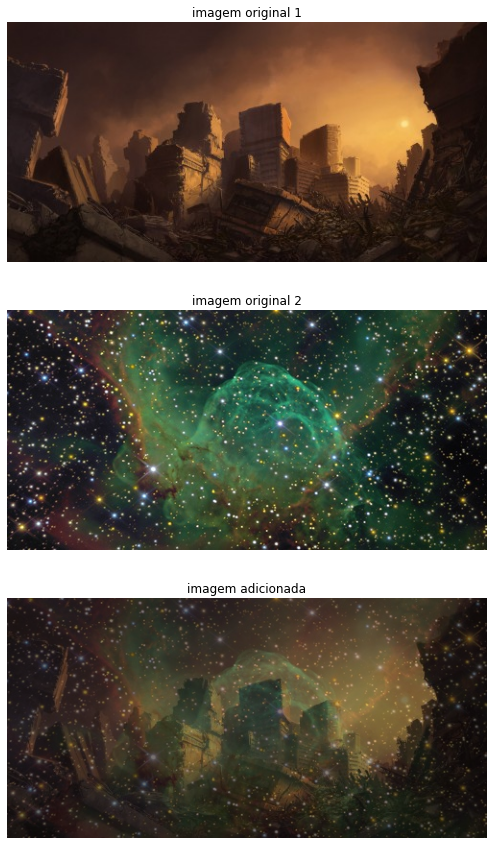

In [36]:
image1 = cv2.imread('imagemA.jpg')  
image2 = cv2.imread('imagemB.jpg') 


weightedSum = cv2.addWeighted(image1, 0.5, image2, 0.4, 0)

plt.figure(figsize=(15,15)) 
plt.subplot(311)
plt.imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB), cmap="gray", vmin=0, vmax=255)
plt.title("imagem original 1")
plt.axis('off')
plt.subplot(312)
plt.imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB), cmap="gray", vmin=0, vmax=255)
plt.title("imagem original 2")
plt.axis('off')
plt.subplot(313)
plt.imshow(cv2.cvtColor(weightedSum, cv2.COLOR_BGR2RGB), cmap="gray", vmin=0, vmax=255)
plt.title("imagem adicionada")
plt.axis('off')


## Subtração de imagens

(-0.5, 499.5, 249.5, -0.5)

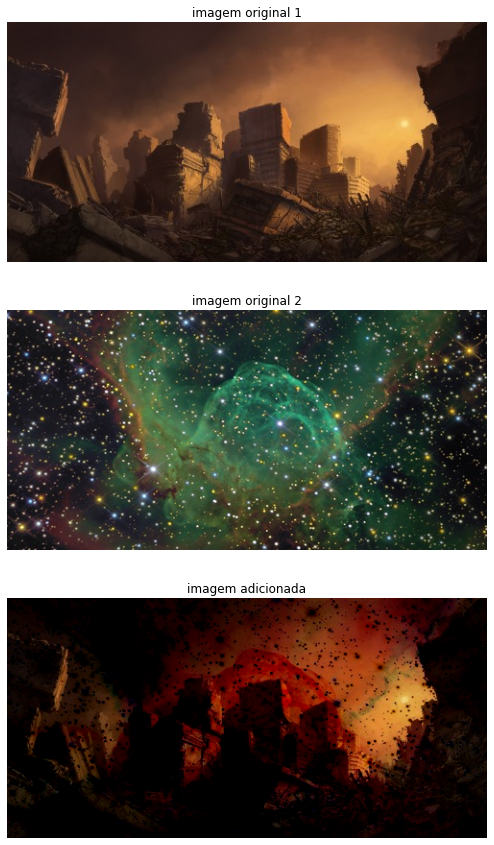

In [38]:
sub = cv2.subtract(image1, image2) 
plt.figure(figsize=(15,15)) 
plt.subplot(311)
plt.imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB), cmap="gray", vmin=0, vmax=255)
plt.title("imagem original 1")
plt.axis('off')
plt.subplot(312)
plt.imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB), cmap="gray", vmin=0, vmax=255)
plt.title("imagem original 2")
plt.axis('off')
plt.subplot(313)
plt.imshow(cv2.cvtColor(sub, cv2.COLOR_BGR2RGB), cmap="gray", vmin=0, vmax=255)
plt.title("imagem adicionada")
plt.axis('off')


(-0.5, 600.5, 601.5, -0.5)

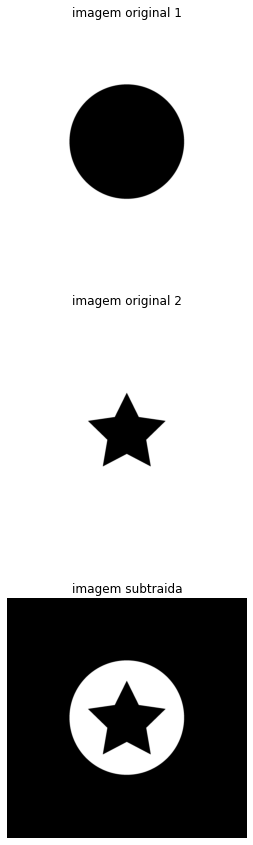

In [42]:
image3 = cv2.imread('imagemC.png')  
image4 = cv2.imread('imagemD.png')

sub2 = image4 - image3
plt.figure(figsize=(15,15)) 
plt.subplot(311)
plt.imshow(cv2.cvtColor(image3, cv2.COLOR_BGR2RGB), cmap="gray", vmin=0, vmax=255)
plt.title("imagem original 1")
plt.axis('off')
plt.subplot(312)
plt.imshow(cv2.cvtColor(image4, cv2.COLOR_BGR2RGB), cmap="gray", vmin=0, vmax=255)
plt.title("imagem original 2")
plt.axis('off')
plt.subplot(313)
plt.imshow(cv2.cvtColor(sub2, cv2.COLOR_BGR2RGB), cmap="gray", vmin=0, vmax=255)
plt.title("imagem subtraida")
plt.axis('off')


Mais funções para subtração de fundo: 
https://acervolima.com/subtracao-de-fundo-opencv/

## Filtragem espacial

A filtragem espacial de imagens utiliza um elemento (filtro) para realizar operações que considerem não apenas o pixel atual, mas também outros pixels da imagem, comumente de acordo com uma vizinhança local (ou seja, pixels com coordenadas similares à do pixel sendo processado).
Há métodos conhecidos como de filtragem não-local que operam sobre pixels distan distantes em termos de coordenadas, mas próximos com relação à similaridade de intensidade. Esses métodos tem resultados interessantes, mas não abordaremos nesse documento.
A operação matemática que define a filtragem espacial local é conhecida por convolução, dada pelo operador asterisco ou estrela * (é importante diferenciar esse de um simples produto, que em notação matemática não é dado por esse mesmo símbolo):
$$ g = w * f$$
A equação acima significa que uma nova imagem g é obtida pela convolução do filtro w com a imagem de entrada f
Para filtrar um pixel na imagem f centrado na coordenada (x,y), produzindo um novo pixel g(x,y), temos:
$$ g(x,y) = \sum_{s=-a}^{a} \sum_{t=-b}^{b} w(s,t) \cdot f(x-s, y-t)$$
A idéia dessa equação é que o filtro w tenha dimensões diferentes de f. Vamos dizer que w tem tamanho m x n e que f tenha tamanho M x N.
Outra questão importante é que a equação assume que o filtro w é centrado na posição (0,0). Isso complica um pouco a equação, mas na prática a operação é bem simples.
Para que a equação anterior funcione é preciso que m = 2a+1 e n = 2b+1


In [2]:
# vamos implementar uma funcao que executa convolucao para todos os pixels (x,y) da imagem
def image_convolution(f, w, debug=False):
    N,M = f.shape
    n,m = w.shape
    
    a = int((n-1)/2)
    b = int((m-1)/2)

    # obtem filtro invertido
    w_flip = np.flip( np.flip(w, 0) , 1)

    g = np.zeros(f.shape, dtype=np.uint8)

    # para cada pixel:
    for x in range(a,N-a):
        for y in range(b,M-b):
            # obtem submatriz a ser usada na convolucao
            sub_f = f[ x-a : x+a+1 , y-b:y+b+1 ]
            if (debug==True):
                print(str(x)+","+str(y)+" - subimage:\n"+str(sub_f))
            # calcula g em x,y
            g[x,y] = np.sum( np.multiply(sub_f, w_flip)).astype(np.uint8)

    return g

# Filtragem de imagens

Os filtros podem ser projetados com finalidades diferentes.
Os filtros mais comuns usados são: filtros **smoothing**, que produzem imagens com menor variação local, reduzindo o ruído, mas também suprimindo pequenos detalhes e texturas; e filtros **diferenciais**, que funcionam como operador derivado, que podem ser usados para detectar transições locais, realçar a variação local, aumentando detalhes e ruídos se presentes na imagem.

Vamos mostrar alguns exemplos

In [3]:
img1 = cv2.imread("pattern.png")
img2 = cv2.imread("gradient_noise.png")
img3 = cv2.imread("board.jpg")

#so convertendo devido ao BGR do opencv
img1_pb = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY) 
img2_pb = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY) 
img3_pb = cv2.cvtColor(img3, cv2.COLOR_BGR2GRAY)



## Filtro da média

In [4]:
# filtro de média 3x3 (simétrico) que considera a 4-vizinhança
w_med = np.matrix([[1, 1, 1], [1, 1, 1], [1, 1, 1]])/9.0
print(w_med)

[[0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]]


(-0.5, 319.5, 319.5, -0.5)

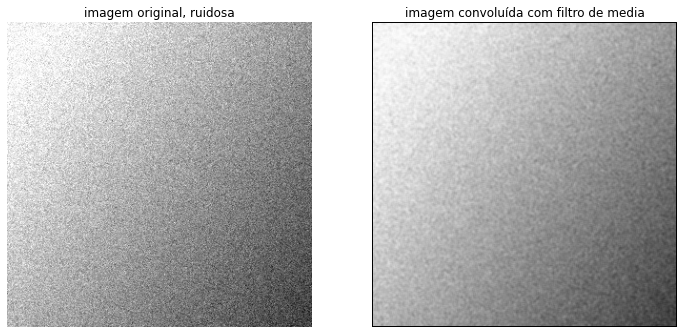

In [5]:
img2_media = image_convolution(img2_pb, w_med)

# exibindo imagem original e filtrada por w_med
plt.figure(figsize=(12,12)) 
plt.subplot(121)
plt.imshow(cv2.cvtColor(img2_pb, cv2.COLOR_BGR2RGB), cmap="gray", vmin=0, vmax=255)
plt.title("imagem original, ruidosa")
plt.axis('off')
plt.subplot(122)
plt.imshow(cv2.cvtColor(img2_media, cv2.COLOR_BGR2RGB), cmap="gray", vmin=0, vmax=255)
plt.title("imagem convoluída com filtro de media")
plt.axis('off')

Note que a imagem da direita tem uma borda com pixels pretos (valor 0) - isso ocorre porque não processamos os a pixels da borda, dado por: $a = (m-1)/2$, onde m é o tamanho do filtro. Nesse caso a = 1 e portanto a borda com valores 0 tem 1 pixel.
Por exemplo, se aplicarmos um filtro maior, de tamanho 7, então teremos 3 pixels de borda.


## Filtro dos k vizinhos mais próximos

In [19]:
def meanKernel(center,matrix,k): #center: coordenada central a ser filtrada , matrix: o kernel , k: the número de vizinhos
    matrix = matrix.astype('int')
    list1 = [[abs(i-center),i] for i in matrix.ravel()] #Expanda a matriz onde o alvo está localizado, subtraia e classifique o primeiro k correspondente
    list1.sort() #ordena a lista
    print(list1)
    #soma todos os k vizinhos e computa a media
    print(round(np.array(list1)[1:k+1,1].mean()))
    return round(np.array(list1)[1:k+1,1].mean()) # retorna o valor arrendodado para novo valor da coordenada filtrada
    

def KNN(img,kernel,k):
    result_img = img.copy()
    for i in range(result_img.shape[0]-kernel+1):  #（0,3）
        for j in range(result_img.shape[0]-kernel+1):
            result_img[i+int(kernel/2)][j+int(kernel/2)] = meanKernel(result_img[i+int(kernel/2)][j+int(kernel/2)],img[i:i+kernel,j:j+kernel],5)
    return result_img

In [20]:
img= np.array([[1,20,19,45,33],
                [11,21,2,37,48],
                [52,76,26,87,93],
                [59,73,6,82,8],
                [5,63,76,81,99]])
kernel = 3 #3*3 template de filtro
k = 5 #k numero de vizinhos
imgNova = KNN(img, kernel, k)

[[0, 21], [1, 20], [2, 19], [5, 26], [10, 11], [19, 2], [20, 1], [31, 52], [55, 76]]
16
[[0, 2], [17, 19], [18, 20], [19, 21], [24, 26], [35, 37], [43, 45], [74, 76], [85, 87]]
25
[[0, 37], [4, 33], [8, 45], [11, 26], [11, 48], [18, 19], [35, 2], [50, 87], [56, 93]]
34
[[0, 76], [3, 73], [17, 59], [24, 52], [50, 26], [55, 21], [65, 11], [70, 6], [74, 2]]
46
[[0, 26], [5, 21], [11, 37], [20, 6], [24, 2], [47, 73], [50, 76], [56, 82], [61, 87]]
28
[[0, 87], [5, 82], [6, 93], [39, 48], [50, 37], [61, 26], [79, 8], [81, 6], [85, 2]]
57
[[0, 73], [3, 76], [3, 76], [10, 63], [14, 59], [21, 52], [47, 26], [67, 6], [68, 5]]
65
[[0, 6], [20, 26], [57, 63], [67, 73], [70, 76], [70, 76], [75, 81], [76, 82], [81, 87]]
63
[[0, 82], [1, 81], [5, 87], [6, 76], [11, 93], [17, 99], [56, 26], [74, 8], [76, 6]]
87


In [21]:
imgNova

array([[ 1, 20, 19, 45, 33],
       [11, 16, 25, 34, 48],
       [52, 46, 28, 57, 93],
       [59, 65, 63, 87,  8],
       [ 5, 63, 76, 81, 99]])

In [22]:
imgNova = KNN(img2_pb, kernel, k)

[[0, 255], [0, 255], [0, 255], [0, 255], [0, 255], [11, 244], [14, 241], [23, 232], [31, 224]]
253
[[0, 255], [0, 255], [0, 255], [0, 255], [14, 241], [14, 241], [15, 240], [31, 224], [41, 214]]
249
[[0, 240], [1, 241], [1, 241], [8, 232], [14, 254], [15, 255], [15, 255], [22, 218], [26, 214]]
245
[[0, 232], [5, 237], [7, 239], [8, 240], [9, 223], [9, 241], [14, 218], [18, 214], [22, 254]]
236
[[0, 237], [2, 239], [4, 241], [5, 232], [12, 225], [14, 223], [17, 254], [18, 255], [19, 218]]
232
[[0, 255], [0, 255], [1, 254], [3, 252], [14, 241], [16, 239], [18, 237], [30, 225], [32, 223]]
248
[[0, 252], [2, 254], [3, 249], [3, 255], [3, 255], [3, 255], [3, 255], [11, 241], [27, 225]]
254
[[0, 255], [0, 255], [0, 255], [0, 255], [1, 254], [3, 252], [6, 249], [22, 233], [29, 226]]
254
[[0, 233], [7, 226], [13, 220], [16, 249], [17, 250], [22, 255], [22, 255], [22, 255], [22, 255]]
240
[[0, 255], [0, 255], [0, 255], [5, 250], [9, 246], [22, 233], [29, 226], [35, 220], [42, 213]]
248
[[0, 213

[[0, 188], [2, 186], [2, 190], [13, 201], [15, 203], [28, 216], [41, 229], [43, 231], [59, 247]]
199
[[0, 216], [13, 229], [23, 193], [23, 193], [26, 190], [28, 188], [30, 186], [31, 185], [31, 247]]
199
[[0, 185], [1, 186], [3, 182], [5, 190], [8, 193], [8, 193], [11, 174], [31, 216], [35, 220]]
189
[[0, 182], [3, 185], [8, 174], [11, 193], [11, 193], [11, 193], [18, 200], [38, 220], [57, 239]]
188
[[0, 193], [2, 195], [7, 200], [11, 182], [19, 174], [22, 171], [27, 220], [32, 225], [46, 239]]
184
[[0, 225], [10, 215], [14, 239], [25, 200], [30, 195], [31, 194], [32, 193], [34, 191], [54, 171]]
209
[[0, 215], [4, 211], [10, 225], [20, 195], [20, 195], [21, 194], [24, 191], [27, 242], [44, 171]]
204
[[0, 195], [1, 194], [2, 197], [4, 191], [16, 211], [16, 211], [20, 215], [21, 174], [47, 242]]
201
[[0, 211], [0, 211], [7, 218], [9, 202], [14, 197], [16, 195], [31, 242], [32, 179], [37, 174]]
205
[[0, 179], [5, 174], [18, 197], [21, 200], [23, 202], [23, 202], [32, 211], [33, 212], [39,

183
[[0, 166], [11, 177], [11, 177], [13, 153], [26, 192], [38, 204], [46, 212], [48, 214], [67, 233]]
181
[[0, 192], [11, 181], [12, 204], [15, 177], [17, 209], [20, 212], [22, 214], [26, 166], [32, 224]]
197
[[0, 181], [8, 189], [11, 192], [22, 159], [23, 204], [24, 205], [28, 209], [31, 212], [43, 224]]
190
[[0, 159], [22, 181], [28, 187], [30, 189], [43, 202], [46, 205], [50, 209], [50, 209], [65, 224]]
193
[[0, 187], [2, 189], [7, 194], [15, 202], [18, 205], [22, 209], [25, 212], [28, 159], [28, 159]]
200
[[0, 194], [6, 200], [7, 187], [8, 202], [15, 209], [18, 212], [34, 160], [35, 159], [39, 155]]
202
[[0, 155], [3, 158], [4, 159], [5, 160], [38, 193], [39, 194], [45, 200], [50, 205], [57, 212]]
173
[[0, 193], [4, 189], [7, 200], [12, 205], [15, 178], [17, 176], [33, 160], [35, 158], [38, 155]]
190
[[0, 178], [2, 176], [10, 188], [11, 189], [11, 189], [15, 193], [20, 158], [27, 205], [29, 149]]
187
[[0, 189], [0, 189], [1, 188], [8, 181], [11, 178], [13, 176], [13, 202], [17, 17

197
[[0, 197], [5, 202], [9, 188], [13, 210], [21, 218], [25, 172], [30, 227], [31, 228], [51, 248]]
198
[[0, 218], [3, 221], [8, 226], [9, 227], [10, 228], [16, 202], [21, 197], [30, 248], [37, 255]]
221
[[0, 221], [3, 218], [5, 226], [13, 208], [19, 202], [19, 240], [22, 243], [27, 248], [34, 255]]
219
[[0, 240], [3, 243], [7, 247], [14, 226], [15, 255], [19, 221], [32, 208], [48, 192], [64, 176]]
238
[[0, 176], [16, 192], [20, 196], [26, 202], [32, 208], [55, 231], [64, 240], [67, 243], [71, 247]]
206
[[0, 202], [6, 196], [9, 211], [10, 192], [12, 214], [16, 218], [26, 176], [29, 231], [45, 247]]
206
[[0, 211], [3, 214], [6, 205], [7, 218], [9, 202], [11, 222], [15, 196], [20, 231], [27, 184]]
212
[[0, 205], [6, 211], [9, 214], [13, 218], [15, 220], [17, 222], [21, 184], [28, 233], [39, 244]]
217
[[0, 244], [9, 235], [11, 233], [21, 223], [22, 222], [24, 220], [28, 216], [39, 205], [60, 184]]
227
[[0, 235], [2, 233], [9, 244], [12, 223], [15, 220], [19, 216], [41, 194], [47, 188], [

240
[[0, 255], [0, 255], [0, 255], [0, 255], [1, 254], [6, 249], [16, 239], [21, 234], [21, 234]]
254
[[0, 249], [5, 244], [6, 255], [6, 255], [6, 255], [6, 255], [6, 255], [6, 255], [15, 234]]
253
[[0, 244], [5, 249], [8, 236], [10, 254], [11, 255], [11, 255], [11, 255], [11, 255], [11, 255]]
250
[[0, 236], [8, 244], [9, 245], [16, 252], [18, 254], [19, 255], [19, 255], [19, 255], [19, 255]]
250
[[0, 252], [1, 251], [2, 254], [3, 255], [3, 255], [3, 255], [7, 245], [16, 236], [33, 219]]
254
[[0, 251], [1, 252], [1, 252], [2, 253], [4, 247], [4, 255], [4, 255], [6, 245], [32, 219]]
252
[[0, 253], [1, 252], [2, 251], [2, 255], [2, 255], [2, 255], [2, 255], [6, 247], [34, 219]]
254
[[0, 255], [0, 255], [0, 255], [0, 255], [0, 255], [2, 253], [3, 252], [8, 247], [22, 233]]
255
[[0, 233], [2, 235], [21, 254], [22, 255], [22, 255], [22, 255], [22, 255], [22, 255], [22, 255]]
251
[[0, 254], [1, 255], [1, 255], [1, 255], [1, 255], [1, 255], [10, 244], [19, 235], [21, 233]]
255
[[0, 255], [0, 

[[0, 165], [10, 175], [22, 143], [23, 188], [24, 141], [25, 190], [26, 191], [31, 196], [53, 218]]
167
[[0, 143], [4, 147], [22, 165], [32, 175], [32, 175], [39, 182], [47, 190], [48, 191], [53, 196]]
169
[[0, 147], [4, 143], [14, 161], [27, 174], [28, 175], [35, 182], [35, 182], [43, 190], [49, 196]]
167
[[0, 174], [1, 175], [6, 168], [6, 168], [8, 182], [8, 182], [13, 161], [14, 188], [27, 147]]
175
[[0, 188], [2, 186], [6, 182], [7, 181], [14, 174], [20, 168], [20, 168], [26, 162], [27, 161]]
178
[[0, 162], [1, 161], [6, 168], [6, 168], [19, 181], [20, 182], [24, 186], [26, 188], [31, 193]]
172
[[0, 182], [0, 182], [1, 181], [4, 186], [11, 193], [20, 162], [21, 161], [21, 203], [30, 152]]
181
[[0, 152], [9, 161], [24, 176], [30, 182], [30, 182], [37, 189], [41, 193], [46, 198], [51, 203]]
178
[[0, 198], [5, 203], [6, 204], [9, 189], [10, 188], [16, 182], [22, 176], [40, 158], [46, 152]]
193
[[0, 188], [1, 189], [10, 198], [12, 176], [12, 176], [16, 204], [30, 158], [41, 147], [43, 1

203
[[0, 212], [2, 210], [5, 217], [10, 222], [13, 225], [17, 195], [21, 191], [28, 184], [31, 181]]
214
[[0, 210], [2, 212], [6, 216], [7, 203], [7, 203], [12, 222], [19, 191], [26, 184], [29, 181]]
211
[[0, 203], [0, 203], [3, 200], [7, 210], [13, 216], [19, 184], [19, 222], [23, 226], [36, 239]]
203
[[0, 200], [3, 203], [3, 203], [6, 194], [16, 216], [17, 183], [21, 221], [26, 226], [39, 239]]
200
[[0, 183], [5, 188], [6, 189], [11, 194], [17, 200], [18, 201], [38, 221], [43, 226], [56, 239]]
194
[[0, 201], [7, 194], [12, 189], [13, 188], [18, 183], [20, 221], [21, 222], [32, 233], [33, 234]]
195
[[0, 233], [1, 234], [11, 222], [18, 251], [22, 255], [32, 201], [32, 201], [44, 189], [45, 188]]
233
[[0, 201], [5, 196], [13, 188], [14, 187], [21, 222], [32, 233], [33, 234], [50, 251], [54, 255]]
205
[[0, 188], [1, 187], [5, 183], [7, 181], [8, 196], [13, 201], [63, 251], [67, 255], [67, 255]]
190
[[0, 181], [2, 183], [6, 187], [7, 188], [15, 196], [27, 208], [38, 219], [67, 248], [74, 

[[0, 210], [11, 221], [15, 225], [20, 230], [24, 234], [26, 236], [31, 241], [37, 247], [43, 253]]
229
[[0, 230], [5, 225], [11, 241], [11, 241], [16, 246], [17, 247], [20, 210], [23, 253], [25, 255]]
240
[[0, 241], [0, 241], [5, 246], [6, 235], [8, 233], [11, 230], [14, 255], [14, 255], [16, 225]]
237
[[0, 233], [2, 235], [8, 241], [8, 241], [13, 246], [16, 249], [22, 255], [22, 255], [22, 255]]
242
[[0, 249], [6, 255], [6, 255], [6, 255], [8, 241], [8, 241], [10, 239], [14, 235], [16, 233]]
249
[[0, 239], [2, 241], [2, 241], [4, 235], [7, 232], [10, 249], [16, 255], [16, 255], [16, 255]]
240
[[0, 232], [2, 234], [3, 235], [7, 239], [9, 241], [16, 248], [23, 255], [23, 255], [48, 184]]
239
[[0, 248], [7, 255], [7, 255], [7, 255], [13, 235], [14, 234], [16, 232], [34, 214], [64, 184]]
247
[[0, 214], [6, 208], [12, 226], [20, 234], [30, 184], [30, 244], [34, 248], [41, 255], [41, 255]]
219
[[0, 226], [4, 222], [12, 214], [18, 208], [18, 244], [20, 246], [21, 247], [29, 255], [29, 255]]


[[0, 216], [2, 218], [7, 209], [10, 206], [11, 227], [17, 233], [22, 238], [31, 247], [49, 167]]
219
[[0, 209], [4, 205], [7, 216], [16, 193], [18, 227], [24, 233], [26, 183], [29, 238], [38, 247]]
215
[[0, 183], [1, 182], [10, 193], [19, 202], [22, 205], [26, 209], [40, 223], [55, 238], [64, 247]]
198
[[0, 202], [3, 205], [9, 193], [19, 183], [20, 182], [21, 223], [26, 228], [31, 171], [31, 233]]
197
[[0, 233], [5, 228], [5, 238], [10, 223], [13, 220], [27, 206], [31, 202], [51, 182], [62, 171]]
223
[[0, 206], [2, 208], [14, 192], [14, 220], [22, 228], [26, 180], [27, 233], [32, 238], [35, 171]]
206
[[0, 208], [2, 206], [5, 203], [9, 217], [12, 220], [16, 192], [28, 180], [30, 238], [43, 165]]
208
[[0, 203], [1, 202], [5, 208], [9, 212], [11, 192], [11, 214], [14, 217], [23, 180], [38, 165]]
206
[[0, 202], [1, 203], [10, 212], [12, 214], [15, 217], [15, 217], [20, 182], [29, 173], [37, 165]]
213
[[0, 182], [9, 173], [20, 202], [21, 161], [30, 212], [32, 214], [34, 216], [35, 217], [40

[[0, 148], [21, 169], [34, 182], [42, 190], [43, 191], [46, 194], [47, 195], [50, 198], [71, 219]]
185
[[0, 191], [1, 190], [3, 188], [3, 194], [9, 182], [10, 201], [15, 176], [28, 219], [43, 148]]
191
[[0, 201], [2, 203], [7, 194], [10, 191], [11, 190], [13, 188], [18, 219], [22, 223], [25, 176]]
193
[[0, 203], [1, 202], [2, 201], [10, 193], [13, 190], [15, 188], [15, 188], [20, 223], [27, 176]]
195
[[0, 202], [1, 203], [9, 193], [12, 190], [14, 188], [14, 188], [21, 223], [33, 235], [62, 140]]
192
[[0, 235], [7, 228], [33, 202], [42, 193], [46, 189], [47, 188], [47, 188], [47, 188], [95, 140]]
200
[[0, 189], [1, 188], [1, 188], [1, 188], [1, 190], [16, 205], [39, 228], [46, 235], [49, 140]]
192
[[0, 190], [0, 190], [1, 189], [2, 188], [2, 188], [4, 186], [7, 183], [15, 205], [38, 228]]
188
[[0, 190], [0, 190], [2, 188], [4, 186], [7, 183], [13, 203], [14, 176], [15, 205], [21, 169]]
190
[[0, 176], [4, 172], [7, 169], [7, 183], [10, 186], [14, 190], [15, 191], [23, 153], [27, 203]]
18

244
[[0, 239], [4, 235], [6, 245], [7, 232], [8, 247], [8, 247], [8, 247], [14, 225], [16, 255]]
241
[[0, 247], [0, 247], [0, 247], [5, 252], [8, 239], [8, 255], [8, 255], [15, 232], [55, 192]]
248
[[0, 252], [3, 255], [3, 255], [5, 247], [5, 247], [16, 236], [20, 232], [28, 224], [60, 192]]
248
[[0, 232], [4, 236], [8, 224], [9, 223], [15, 217], [19, 251], [20, 252], [23, 255], [40, 192]]
230
[[0, 217], [2, 215], [6, 223], [7, 224], [15, 232], [19, 236], [31, 248], [33, 250], [34, 251]]
226
[[0, 248], [1, 249], [2, 246], [2, 250], [3, 251], [7, 255], [25, 223], [31, 217], [33, 215]]
250
[[0, 249], [1, 248], [1, 250], [3, 246], [3, 252], [6, 255], [6, 255], [34, 215], [34, 215]]
250
[[0, 252], [3, 249], [3, 255], [3, 255], [3, 255], [3, 255], [3, 255], [6, 246], [37, 215]]
254
[[0, 255], [0, 255], [0, 255], [0, 255], [3, 252], [14, 241], [18, 237], [31, 224], [40, 215]]
252
[[0, 224], [13, 211], [13, 237], [17, 241], [29, 253], [31, 255], [31, 255], [31, 255], [31, 255]]
239
[[0, 255],

235
[[0, 226], [0, 226], [6, 232], [12, 238], [24, 202], [25, 201], [28, 198], [29, 255], [29, 255]]
220
[[0, 238], [4, 234], [4, 242], [6, 232], [12, 226], [17, 255], [26, 212], [36, 202], [40, 198]]
238
[[0, 242], [4, 238], [8, 234], [10, 232], [22, 220], [30, 212], [40, 202], [46, 196], [52, 190]]
227
[[0, 190], [6, 196], [11, 201], [22, 212], [30, 220], [43, 233], [44, 234], [52, 242], [52, 242]]
212
[[0, 233], [1, 232], [9, 242], [12, 221], [13, 220], [21, 212], [32, 201], [37, 196], [43, 190]]
225
[[0, 232], [0, 232], [1, 233], [9, 223], [10, 242], [11, 221], [15, 247], [20, 212], [31, 201]]
230
[[0, 247], [15, 232], [15, 232], [19, 228], [24, 223], [26, 221], [35, 212], [37, 210], [39, 208]]
227
[[0, 228], [4, 232], [4, 232], [5, 223], [18, 210], [19, 209], [19, 247], [20, 208], [28, 200]]
221
[[0, 200], [8, 208], [9, 209], [10, 190], [10, 210], [27, 227], [28, 228], [30, 230], [32, 232]]
209
[[0, 230], [2, 232], [3, 227], [3, 227], [21, 209], [25, 255], [26, 204], [30, 200], [4

[[0, 231], [6, 237], [10, 221], [13, 218], [16, 215], [17, 214], [17, 214], [24, 255], [35, 196]]
221
[[0, 221], [7, 214], [8, 213], [10, 231], [11, 232], [16, 237], [22, 199], [25, 196], [34, 255]]
225
[[0, 199], [1, 200], [6, 205], [14, 213], [15, 214], [18, 217], [22, 221], [33, 232], [38, 237]]
210
[[0, 217], [4, 213], [4, 221], [7, 224], [12, 205], [15, 232], [17, 200], [18, 199], [25, 242]]
219
[[0, 242], [18, 224], [21, 221], [25, 217], [36, 206], [37, 205], [42, 200], [46, 196], [68, 174]]
215
[[0, 206], [10, 196], [14, 192], [15, 221], [18, 224], [22, 228], [32, 174], [32, 238], [36, 242]]
212
[[0, 192], [3, 195], [4, 196], [9, 183], [14, 206], [18, 174], [31, 223], [36, 228], [46, 238]]
191
[[0, 223], [5, 228], [11, 212], [15, 208], [15, 238], [23, 200], [28, 195], [31, 192], [40, 183]]
217
[[0, 208], [4, 212], [4, 212], [8, 200], [13, 195], [14, 222], [15, 223], [17, 191], [25, 183]]
208
[[0, 222], [8, 214], [10, 212], [10, 212], [13, 209], [14, 208], [22, 200], [31, 191], [

169
[[0, 160], [7, 167], [10, 150], [16, 176], [16, 176], [23, 137], [24, 136], [25, 185], [28, 188]]
161
[[0, 188], [3, 185], [14, 174], [18, 170], [28, 160], [38, 150], [41, 147], [51, 137], [52, 136]]
168
[[0, 170], [4, 174], [7, 177], [12, 158], [15, 185], [18, 188], [19, 189], [23, 147], [33, 137]]
176
[[0, 158], [11, 147], [11, 169], [12, 170], [16, 174], [19, 177], [19, 177], [27, 185], [31, 189]]
167
[[0, 169], [4, 165], [8, 177], [8, 177], [9, 178], [11, 158], [16, 185], [20, 189], [43, 126]]
171
[[0, 126], [13, 139], [30, 156], [31, 157], [39, 165], [43, 169], [51, 177], [52, 178], [59, 185]]
157
[[0, 156], [1, 157], [9, 165], [17, 139], [17, 139], [21, 177], [22, 178], [30, 126], [54, 210]]
155
[[0, 210], [33, 177], [38, 172], [42, 168], [53, 157], [54, 156], [64, 146], [71, 139], [71, 139]]
166
[[0, 146], [7, 139], [11, 157], [14, 132], [18, 128], [22, 168], [26, 172], [31, 177], [64, 210]]
145
[[0, 132], [4, 128], [14, 146], [22, 154], [25, 157], [26, 158], [36, 168], [40,

[[0, 137], [2, 135], [2, 139], [19, 156], [24, 161], [25, 162], [27, 164], [32, 105], [35, 172]]
151
[[0, 139], [0, 139], [2, 137], [5, 144], [17, 156], [23, 162], [25, 164], [31, 170], [34, 105]]
148
[[0, 139], [0, 139], [5, 144], [5, 144], [15, 124], [23, 162], [24, 163], [25, 164], [31, 170]]
143
[[0, 144], [0, 144], [1, 145], [4, 148], [5, 139], [19, 163], [20, 124], [26, 170], [27, 171]]
148
[[0, 145], [1, 144], [3, 148], [5, 140], [12, 133], [18, 163], [21, 124], [26, 171], [52, 93]]
146
[[0, 133], [0, 133], [7, 140], [11, 144], [12, 145], [15, 148], [26, 107], [38, 171], [40, 93]]
142
[[0, 144], [4, 140], [5, 139], [11, 133], [11, 133], [16, 160], [32, 112], [37, 107], [51, 93]]
141
[[0, 112], [5, 107], [15, 97], [21, 133], [27, 139], [32, 144], [41, 153], [48, 160], [48, 160]]
124
[[0, 160], [0, 160], [7, 153], [12, 148], [21, 139], [26, 134], [28, 132], [48, 112], [63, 97]]
147
[[0, 132], [2, 134], [4, 136], [16, 148], [18, 150], [21, 153], [24, 156], [28, 160], [35, 97]]
144


[[0, 194], [1, 195], [9, 203], [12, 206], [26, 168], [26, 220], [28, 222], [28, 222], [32, 226]]
198
[[0, 195], [1, 194], [2, 197], [11, 206], [21, 216], [25, 220], [27, 168], [31, 226], [60, 255]]
207
[[0, 216], [4, 220], [10, 206], [19, 197], [21, 195], [26, 242], [31, 185], [32, 184], [39, 255]]
212
[[0, 242], [13, 255], [26, 216], [31, 211], [31, 211], [32, 210], [45, 197], [57, 185], [58, 184]]
221
[[0, 211], [0, 211], [1, 210], [3, 214], [26, 185], [27, 184], [30, 181], [31, 242], [44, 255]]
201
[[0, 255], [38, 217], [41, 214], [44, 211], [44, 211], [45, 210], [51, 204], [74, 181], [83, 172]]
213
[[0, 217], [2, 215], [3, 214], [10, 207], [13, 204], [34, 183], [36, 181], [38, 255], [45, 172]]
205
[[0, 215], [2, 217], [4, 219], [7, 222], [8, 207], [11, 204], [32, 183], [40, 255], [43, 172]]
214
[[0, 222], [3, 219], [7, 215], [12, 210], [15, 207], [17, 205], [31, 191], [33, 255], [39, 183]]
211
[[0, 205], [5, 210], [13, 192], [13, 218], [14, 191], [14, 219], [17, 222], [21, 226], [5

193
[[0, 181], [4, 177], [6, 187], [7, 188], [11, 192], [13, 194], [22, 203], [54, 235], [69, 250]]
188
[[0, 192], [4, 188], [5, 187], [10, 202], [11, 181], [15, 207], [43, 235], [48, 240], [58, 250]]
193
[[0, 207], [1, 206], [5, 202], [7, 214], [15, 192], [18, 225], [20, 187], [33, 240], [43, 250]]
208
[[0, 214], [7, 207], [7, 221], [8, 206], [11, 225], [12, 202], [16, 230], [18, 232], [26, 240]]
212
[[0, 230], [2, 228], [2, 232], [5, 225], [9, 221], [16, 214], [24, 206], [25, 205], [36, 194]]
224
[[0, 194], [7, 201], [11, 205], [13, 207], [27, 221], [34, 228], [36, 230], [38, 232], [50, 244]]
212
[[0, 201], [4, 205], [6, 207], [7, 194], [11, 190], [27, 174], [27, 228], [38, 239], [43, 244]]
194
[[0, 190], [11, 201], [16, 174], [17, 207], [20, 170], [33, 157], [35, 225], [49, 239], [54, 244]]
182
[[0, 170], [4, 174], [13, 157], [20, 190], [23, 193], [26, 196], [42, 212], [55, 225], [69, 239]]
182
[[0, 212], [8, 220], [13, 225], [16, 196], [19, 193], [26, 186], [34, 178], [42, 170], [5

[[0, 169], [5, 174], [6, 175], [10, 179], [10, 179], [12, 181], [30, 199], [31, 200], [36, 205]]
178
[[0, 181], [1, 180], [2, 179], [6, 175], [7, 174], [10, 171], [12, 169], [19, 200], [26, 207]]
176
[[0, 171], [4, 175], [9, 162], [9, 180], [10, 181], [21, 150], [29, 200], [31, 140], [36, 207]]
170
[[0, 140], [10, 150], [22, 162], [28, 168], [31, 171], [40, 180], [40, 180], [52, 192], [67, 207]]
166
[[0, 180], [1, 181], [4, 176], [12, 168], [12, 192], [18, 162], [21, 201], [30, 150], [40, 140]]
176
[[0, 176], [4, 180], [5, 181], [8, 168], [16, 192], [19, 195], [21, 197], [25, 201], [39, 215]]
183
[[0, 195], [2, 197], [4, 199], [6, 201], [9, 186], [14, 181], [19, 176], [20, 215], [23, 172]]
193
[[0, 199], [2, 197], [4, 195], [8, 191], [13, 186], [16, 215], [27, 172], [32, 167], [41, 158]]
197
[[0, 167], [5, 172], [7, 160], [9, 158], [12, 179], [19, 186], [24, 191], [32, 199], [36, 203]]
171
[[0, 179], [5, 174], [11, 190], [12, 167], [12, 191], [19, 160], [21, 158], [24, 203], [35, 214]]

204
[[0, 191], [1, 192], [7, 184], [12, 179], [13, 204], [13, 204], [16, 207], [18, 209], [19, 172]]
193
[[0, 204], [3, 201], [3, 207], [11, 193], [13, 191], [20, 184], [25, 179], [25, 179], [32, 172]]
195
[[0, 179], [0, 179], [4, 183], [5, 184], [14, 193], [16, 195], [22, 201], [25, 204], [37, 216]]
187
[[0, 195], [2, 193], [6, 201], [12, 183], [13, 208], [16, 179], [16, 211], [19, 214], [21, 216]]
193
[[0, 214], [2, 216], [3, 211], [6, 208], [16, 198], [19, 195], [29, 185], [31, 183], [33, 181]]
206
[[0, 181], [4, 185], [10, 191], [17, 198], [26, 207], [27, 208], [30, 211], [33, 214], [34, 215]]
198
[[0, 207], [2, 209], [8, 215], [9, 198], [16, 191], [20, 227], [21, 186], [22, 185], [26, 181]]
208
[[0, 227], [1, 226], [7, 220], [12, 215], [18, 209], [20, 207], [36, 191], [38, 189], [41, 186]]
215
[[0, 189], [3, 186], [15, 204], [17, 172], [20, 209], [31, 220], [37, 226], [38, 227], [40, 229]]
198
[[0, 204], [8, 212], [9, 213], [15, 189], [16, 220], [22, 226], [25, 229], [29, 233], [3

[[0, 137], [14, 151], [20, 157], [32, 169], [34, 171], [34, 171], [41, 178], [54, 191], [58, 195]]
164
[[0, 191], [4, 195], [7, 198], [13, 178], [14, 177], [20, 171], [22, 169], [34, 157], [54, 137]]
184
[[0, 157], [2, 159], [12, 169], [20, 177], [21, 178], [22, 179], [33, 190], [34, 191], [41, 198]]
172
[[0, 159], [0, 159], [2, 157], [4, 163], [18, 177], [20, 179], [30, 189], [31, 190], [39, 198]]
167
[[0, 189], [1, 190], [8, 197], [10, 179], [15, 174], [25, 164], [26, 163], [30, 159], [30, 159]]
181
[[0, 164], [1, 163], [3, 161], [5, 159], [10, 174], [15, 179], [20, 184], [25, 189], [33, 197]]
167
[[0, 184], [5, 179], [10, 174], [13, 197], [15, 169], [20, 164], [21, 163], [23, 161], [38, 146]]
177
[[0, 146], [2, 148], [12, 158], [15, 161], [17, 163], [23, 169], [28, 174], [33, 179], [38, 184]]
160
[[0, 148], [2, 146], [10, 158], [11, 159], [15, 163], [21, 169], [23, 171], [26, 174], [46, 194]]
159
[[0, 159], [1, 158], [1, 160], [3, 162], [11, 148], [12, 171], [13, 146], [15, 174], [3

139
[[0, 131], [2, 129], [6, 137], [7, 124], [8, 139], [8, 139], [19, 150], [21, 152], [56, 187]]
134
[[0, 152], [2, 150], [14, 138], [15, 137], [21, 131], [27, 179], [28, 124], [35, 187], [39, 113]]
147
[[0, 138], [14, 124], [14, 124], [14, 152], [25, 113], [28, 166], [41, 179], [49, 187], [51, 189]]
136
[[0, 189], [10, 179], [23, 166], [40, 149], [50, 139], [51, 138], [60, 129], [65, 124], [76, 113]]
154
[[0, 149], [2, 151], [10, 139], [15, 134], [17, 166], [20, 129], [25, 124], [26, 123], [40, 189]]
144
[[0, 123], [1, 122], [6, 129], [11, 134], [16, 139], [26, 149], [27, 150], [28, 151], [34, 157]]
135
[[0, 157], [2, 155], [6, 151], [7, 150], [23, 134], [32, 125], [34, 123], [35, 122], [42, 115]]
143
[[0, 115], [7, 122], [8, 123], [10, 125], [24, 139], [35, 150], [40, 155], [42, 157], [68, 183]]
132
[[0, 123], [2, 125], [2, 125], [8, 115], [16, 139], [32, 155], [52, 175], [60, 183], [61, 184]]
132
[[0, 184], [1, 183], [9, 175], [14, 170], [31, 153], [42, 142], [45, 139], [59, 125], 

[[0, 158], [4, 154], [21, 137], [25, 133], [36, 122], [37, 121], [48, 110], [48, 110], [61, 97]]
133
[[0, 236], [0, 236], [3, 239], [16, 252], [17, 219], [19, 255], [19, 255], [19, 255], [19, 255]]
240
[[0, 255], [0, 255], [0, 255], [8, 247], [16, 239], [19, 236], [19, 236], [45, 210], [53, 202]]
246
[[0, 210], [8, 202], [26, 236], [29, 239], [33, 243], [37, 247], [42, 252], [45, 255], [45, 255]]
233
[[0, 243], [0, 243], [4, 247], [7, 250], [9, 252], [9, 252], [12, 255], [33, 210], [41, 202]]
249
[[0, 250], [2, 252], [2, 252], [5, 255], [7, 243], [7, 243], [15, 235], [19, 231], [20, 230]]
249
[[0, 230], [1, 231], [5, 235], [10, 220], [13, 243], [20, 250], [22, 252], [25, 255], [25, 255]]
236
[[0, 255], [0, 255], [14, 241], [20, 235], [24, 231], [25, 230], [29, 226], [35, 220], [39, 216]]
238
[[0, 226], [6, 220], [10, 216], [15, 241], [22, 248], [29, 255], [29, 255], [29, 255], [29, 255]]
236
[[0, 255], [0, 255], [0, 255], [2, 253], [7, 248], [14, 241], [29, 226], [29, 226], [39, 216]]


[[0, 249], [3, 246], [6, 255], [14, 235], [27, 222], [28, 221], [34, 215], [50, 199], [60, 189]]
236
[[0, 215], [7, 222], [20, 235], [31, 246], [32, 183], [33, 248], [34, 249], [39, 176], [40, 255]]
227
[[0, 183], [7, 176], [11, 194], [28, 211], [30, 213], [32, 215], [39, 222], [65, 248], [72, 255]]
202
[[0, 194], [11, 183], [17, 211], [18, 176], [18, 212], [19, 213], [27, 221], [39, 233], [54, 248]]
199
[[0, 221], [8, 213], [8, 213], [9, 212], [10, 211], [10, 231], [12, 233], [18, 239], [27, 194]]
216
[[0, 239], [6, 233], [8, 231], [14, 225], [18, 221], [20, 219], [23, 216], [26, 213], [27, 212]]
226
[[0, 216], [0, 216], [1, 217], [3, 213], [3, 219], [9, 225], [14, 230], [15, 231], [23, 239]]
218
[[0, 230], [5, 225], [6, 236], [8, 238], [11, 219], [13, 217], [14, 216], [14, 216], [30, 200]]
227
[[0, 200], [13, 213], [16, 216], [17, 217], [27, 227], [30, 230], [36, 236], [36, 236], [38, 238]]
221
[[0, 213], [13, 200], [14, 227], [16, 229], [18, 195], [23, 236], [23, 236], [25, 238], [2

138
[[0, 129], [1, 130], [6, 135], [7, 136], [11, 118], [12, 117], [17, 112], [19, 148], [35, 164]]
127
[[0, 130], [1, 129], [5, 135], [6, 136], [9, 121], [13, 117], [17, 147], [18, 112], [21, 151]]
128
[[0, 147], [1, 146], [4, 151], [11, 136], [12, 135], [16, 163], [17, 130], [26, 121], [26, 121]]
146
[[0, 146], [1, 147], [5, 151], [6, 140], [17, 163], [23, 123], [25, 121], [25, 121], [29, 117]]
145
[[0, 140], [6, 146], [13, 127], [17, 123], [17, 123], [19, 121], [23, 117], [23, 163], [24, 116]]
128
[[0, 123], [0, 123], [3, 120], [4, 127], [6, 117], [7, 116], [10, 113], [14, 109], [17, 140]]
121
[[0, 113], [3, 116], [4, 109], [7, 106], [7, 120], [10, 123], [13, 100], [14, 127], [46, 159]]
115
[[0, 106], [2, 108], [3, 109], [6, 100], [7, 113], [14, 120], [15, 121], [24, 130], [53, 159]]
110
[[0, 216], [0, 216], [4, 220], [12, 228], [24, 240], [32, 248], [35, 251], [39, 255], [39, 255]]
230
[[0, 240], [5, 235], [8, 248], [14, 254], [15, 255], [15, 255], [24, 216], [24, 216], [29, 211]]


229
[[0, 243], [1, 244], [3, 240], [4, 247], [8, 235], [8, 235], [12, 255], [15, 228], [52, 191]]
240
[[0, 255], [0, 255], [8, 247], [12, 243], [15, 240], [20, 235], [20, 235], [38, 217], [42, 213]]
244
[[0, 213], [3, 210], [4, 217], [9, 204], [22, 235], [27, 240], [34, 247], [42, 255], [42, 255]]
221
[[0, 204], [6, 210], [9, 213], [11, 193], [13, 217], [38, 242], [40, 244], [43, 247], [51, 255]]
215
[[0, 244], [2, 242], [3, 247], [6, 250], [16, 228], [21, 223], [34, 210], [40, 204], [51, 193]]
238
[[0, 228], [5, 223], [7, 221], [14, 242], [14, 242], [16, 244], [16, 244], [22, 250], [35, 193]]
234
[[0, 221], [2, 223], [7, 214], [7, 228], [9, 230], [21, 242], [23, 244], [23, 244], [29, 250]]
227
[[0, 244], [0, 244], [2, 242], [3, 241], [4, 240], [14, 230], [22, 222], [23, 221], [30, 214]]
239
[[0, 222], [8, 214], [8, 230], [11, 211], [13, 235], [15, 207], [18, 240], [19, 241], [22, 244]]
219
[[0, 207], [4, 211], [15, 222], [21, 228], [24, 231], [25, 232], [28, 235], [33, 240], [34, 241]

[[0, 199], [0, 199], [4, 195], [13, 186], [13, 186], [22, 221], [25, 224], [34, 233], [41, 158]]
197
[[0, 186], [0, 186], [2, 188], [4, 182], [9, 195], [11, 175], [13, 199], [13, 199], [38, 224]]
185
[[0, 175], [7, 182], [8, 167], [11, 186], [13, 188], [20, 195], [20, 195], [24, 199], [35, 210]]
184
[[0, 195], [7, 188], [7, 188], [11, 206], [13, 182], [15, 210], [20, 175], [28, 167], [37, 158]]
195
[[0, 158], [9, 167], [30, 188], [36, 194], [37, 195], [41, 199], [46, 204], [48, 206], [52, 210]]
189
[[0, 194], [2, 192], [5, 199], [6, 188], [10, 204], [11, 205], [12, 206], [13, 181], [36, 158]]
198
[[0, 205], [1, 204], [6, 199], [11, 194], [13, 192], [17, 188], [19, 224], [22, 183], [24, 181]]
195
[[0, 224], [19, 205], [24, 200], [32, 192], [36, 188], [39, 185], [41, 183], [43, 181], [46, 178]]
194
[[0, 178], [5, 173], [5, 183], [7, 185], [10, 188], [11, 189], [18, 196], [22, 200], [46, 224]]
184
[[0, 173], [5, 178], [12, 185], [14, 187], [16, 189], [22, 195], [23, 196], [27, 200], [39, 

[[0, 146], [15, 161], [21, 167], [31, 177], [38, 184], [39, 185], [43, 189], [43, 189], [54, 200]]
175
[[0, 189], [1, 188], [4, 185], [5, 184], [11, 200], [15, 204], [22, 167], [33, 156], [43, 146]]
192
[[0, 188], [1, 189], [4, 184], [10, 198], [14, 174], [16, 204], [21, 167], [22, 210], [32, 156]]
190
[[0, 174], [14, 188], [18, 156], [18, 156], [24, 198], [28, 146], [30, 204], [31, 205], [36, 210]]
169
[[0, 146], [10, 156], [14, 160], [18, 128], [28, 174], [52, 198], [52, 198], [59, 205], [64, 210]]
163
[[0, 198], [2, 200], [7, 205], [12, 186], [38, 160], [42, 156], [44, 154], [52, 146], [70, 128]]
181
[[0, 200], [2, 198], [9, 191], [14, 186], [17, 183], [35, 165], [40, 160], [46, 154], [72, 128]]
185
[[0, 191], [5, 186], [8, 183], [9, 200], [9, 200], [26, 165], [37, 154], [40, 151], [40, 151]]
187
[[0, 151], [0, 151], [4, 147], [14, 165], [25, 176], [32, 183], [37, 188], [40, 191], [49, 200]]
164
[[0, 147], [4, 151], [4, 151], [13, 160], [24, 171], [29, 176], [41, 188], [43, 190], [5

[[0, 155], [5, 150], [5, 150], [8, 163], [12, 167], [13, 168], [23, 132], [27, 128], [36, 119]]
160
[[0, 150], [0, 150], [3, 153], [5, 155], [9, 141], [11, 139], [17, 167], [18, 168], [31, 119]]
148
[[0, 139], [2, 141], [2, 141], [10, 149], [11, 150], [11, 150], [14, 153], [16, 123], [29, 168]]
146
[[0, 141], [0, 141], [1, 140], [2, 139], [8, 149], [12, 153], [17, 124], [18, 123], [19, 160]]
144
[[0, 124], [1, 123], [16, 140], [17, 141], [25, 149], [28, 96], [34, 158], [36, 160], [36, 160]]
130
[[0, 96], [28, 124], [36, 132], [44, 140], [59, 155], [62, 158], [62, 158], [64, 160], [64, 160]]
142
[[0, 155], [1, 154], [3, 158], [3, 158], [5, 160], [11, 144], [19, 136], [23, 132], [59, 96]]
155
[[0, 144], [3, 147], [7, 137], [8, 136], [10, 154], [11, 155], [12, 132], [14, 158], [15, 159]]
146
[[0, 147], [3, 144], [7, 154], [10, 137], [11, 136], [11, 136], [12, 159], [19, 166], [48, 99]]
141
[[0, 166], [7, 159], [13, 179], [19, 147], [27, 139], [29, 137], [30, 136], [48, 118], [67, 99]]
152

[[0, 222], [6, 228], [11, 211], [12, 234], [13, 235], [13, 235], [21, 243], [24, 198], [33, 255]]
229
[[0, 228], [1, 227], [6, 222], [6, 234], [6, 234], [17, 211], [27, 255], [27, 255], [30, 198]]
226
[[0, 234], [0, 234], [6, 228], [7, 227], [12, 246], [21, 213], [21, 255], [21, 255], [22, 212]]
230
[[0, 213], [1, 212], [14, 227], [18, 195], [21, 192], [21, 234], [24, 189], [33, 246], [42, 255]]
212
[[0, 192], [3, 189], [3, 195], [5, 187], [20, 212], [21, 213], [23, 215], [53, 245], [54, 246]]
199
[[0, 245], [19, 226], [21, 224], [30, 215], [32, 213], [50, 195], [53, 192], [56, 189], [58, 187]]
215
[[0, 226], [2, 224], [11, 215], [13, 213], [18, 208], [19, 245], [24, 250], [39, 187], [61, 165]]
221
[[0, 165], [43, 208], [45, 210], [48, 213], [59, 224], [61, 226], [64, 229], [85, 250], [90, 255]]
216
[[0, 229], [13, 216], [19, 210], [20, 209], [21, 208], [21, 250], [23, 206], [26, 255], [64, 165]]
219
[[0, 209], [1, 210], [3, 206], [3, 212], [7, 216], [12, 197], [20, 229], [33, 176], [4

[[0, 176], [7, 169], [10, 186], [18, 194], [25, 201], [30, 146], [35, 211], [49, 225], [50, 226]]
179
[[0, 226], [22, 204], [25, 201], [32, 194], [38, 188], [50, 176], [52, 174], [57, 169], [80, 146]]
193
[[0, 188], [2, 190], [11, 199], [13, 201], [14, 174], [16, 204], [19, 169], [19, 207], [38, 226]]
194
[[0, 207], [3, 204], [6, 201], [8, 199], [16, 223], [17, 190], [19, 188], [33, 174], [59, 148]]
203
[[0, 223], [16, 207], [22, 201], [24, 199], [33, 190], [53, 170], [60, 163], [75, 148], [84, 139]]
193
[[0, 170], [7, 163], [16, 186], [18, 188], [21, 191], [22, 148], [31, 139], [31, 201], [53, 223]]
175
[[0, 186], [1, 187], [2, 188], [4, 190], [5, 191], [13, 199], [16, 170], [23, 163], [47, 139]]
191
[[0, 199], [3, 202], [3, 202], [8, 191], [9, 190], [11, 188], [12, 187], [13, 186], [32, 167]]
195
[[0, 202], [0, 202], [3, 199], [9, 193], [12, 190], [15, 187], [18, 184], [35, 167], [36, 166]]
194
[[0, 184], [1, 183], [9, 193], [17, 167], [18, 166], [18, 202], [18, 202], [27, 211], [32,

[[0, 104], [8, 96], [11, 93], [21, 125], [32, 136], [36, 140], [39, 143], [42, 146], [65, 169]]
118
[[0, 140], [1, 139], [4, 136], [11, 129], [15, 125], [33, 107], [36, 104], [44, 96], [47, 93]]
127
[[0, 107], [4, 111], [14, 93], [18, 125], [22, 129], [32, 139], [32, 139], [33, 140], [59, 166]]
119
[[0, 111], [4, 107], [18, 129], [27, 138], [27, 138], [28, 139], [28, 139], [29, 140], [55, 166]]
130
[[0, 138], [0, 138], [1, 139], [2, 140], [7, 131], [8, 130], [8, 146], [27, 111], [28, 166]]
136
[[0, 130], [1, 129], [1, 131], [7, 123], [8, 138], [8, 138], [10, 140], [16, 146], [19, 111]]
132
[[0, 111], [12, 123], [16, 127], [18, 129], [19, 130], [20, 131], [29, 140], [35, 146], [43, 154]]
128
[[0, 140], [6, 134], [11, 129], [13, 127], [14, 154], [16, 156], [17, 123], [17, 157], [29, 111]]
140
[[0, 134], [6, 140], [7, 127], [8, 142], [16, 150], [20, 154], [22, 156], [23, 157], [25, 109]]
143
[[0, 150], [0, 150], [6, 156], [7, 157], [8, 142], [8, 158], [16, 134], [31, 119], [41, 109]]
153


175
[[0, 176], [1, 175], [1, 175], [2, 174], [2, 178], [4, 180], [6, 182], [17, 193], [24, 200]]
176
[[0, 182], [6, 176], [7, 175], [8, 174], [9, 173], [11, 193], [13, 169], [15, 167], [18, 200]]
178
[[0, 167], [2, 169], [6, 173], [7, 174], [15, 182], [18, 185], [26, 193], [33, 200], [37, 204]]
177
[[0, 200], [3, 197], [4, 204], [9, 209], [13, 187], [15, 185], [27, 173], [31, 169], [33, 167]]
196
[[0, 209], [5, 204], [9, 200], [12, 197], [12, 221], [21, 188], [22, 187], [24, 185], [43, 166]]
202
[[0, 188], [1, 187], [8, 180], [9, 197], [21, 209], [22, 166], [24, 164], [28, 216], [33, 221]]
188
[[0, 180], [3, 177], [8, 188], [9, 189], [14, 166], [15, 165], [16, 164], [36, 216], [41, 221]]
177
[[0, 165], [1, 164], [3, 162], [12, 177], [14, 179], [15, 180], [15, 180], [24, 189], [51, 216]]
172
[[0, 180], [1, 179], [3, 177], [9, 189], [15, 165], [17, 163], [18, 162], [33, 147], [44, 224]]
175
[[0, 147], [15, 162], [16, 163], [31, 178], [32, 179], [33, 180], [37, 184], [40, 187], [77, 224]]

[[0, 212], [6, 206], [8, 204], [8, 204], [9, 203], [14, 198], [15, 197], [30, 182], [43, 255]]
203
[[0, 206], [2, 204], [2, 204], [3, 203], [3, 209], [6, 212], [12, 218], [16, 190], [49, 255]]
206
[[0, 190], [3, 187], [14, 176], [14, 204], [16, 206], [19, 209], [28, 218], [39, 229], [65, 255]]
196
[[0, 187], [3, 190], [3, 190], [11, 176], [15, 202], [19, 168], [22, 209], [31, 218], [42, 229]]
185
[[0, 202], [12, 190], [15, 187], [15, 217], [26, 176], [27, 229], [34, 168], [37, 239], [46, 156]]
200
[[0, 156], [12, 168], [28, 184], [34, 190], [38, 194], [43, 199], [46, 202], [61, 217], [83, 239]]
187
[[0, 184], [6, 178], [10, 194], [15, 199], [18, 202], [28, 156], [33, 217], [34, 218], [55, 239]]
186
[[0, 218], [7, 225], [10, 208], [16, 202], [19, 199], [20, 198], [24, 194], [34, 184], [40, 178]]
206
[[0, 225], [7, 218], [8, 217], [17, 208], [23, 202], [27, 198], [30, 195], [42, 183], [47, 178]]
209
[[0, 183], [12, 195], [15, 198], [16, 167], [25, 208], [34, 217], [39, 222], [42, 225], [

[[0, 168], [5, 173], [15, 183], [20, 188], [20, 188], [24, 192], [24, 192], [25, 193], [42, 210]]
185
[[0, 210], [10, 200], [11, 199], [11, 199], [17, 193], [22, 188], [27, 183], [37, 173], [42, 168]]
196
[[0, 200], [1, 199], [1, 199], [10, 210], [12, 188], [17, 183], [19, 181], [38, 162], [42, 158]]
196
[[0, 162], [4, 158], [10, 172], [19, 181], [37, 199], [37, 199], [38, 200], [40, 202], [48, 114]]
182
[[0, 172], [8, 164], [9, 181], [10, 162], [10, 162], [14, 158], [30, 202], [30, 202], [58, 114]]
165
[[0, 202], [0, 202], [1, 203], [19, 183], [29, 173], [30, 172], [38, 164], [40, 162], [88, 114]]
187
[[0, 183], [5, 178], [10, 173], [19, 164], [19, 202], [20, 203], [21, 162], [22, 205], [27, 210]]
184
[[0, 210], [5, 205], [5, 205], [7, 203], [10, 200], [20, 230], [27, 183], [32, 178], [37, 173]]
209
[[0, 205], [0, 205], [4, 201], [5, 200], [5, 210], [20, 185], [21, 184], [25, 230], [27, 178]]
200
[[0, 201], [1, 200], [1, 202], [2, 199], [4, 205], [16, 185], [17, 184], [20, 181], [29, 

[[0, 162], [2, 160], [5, 157], [8, 154], [12, 150], [14, 148], [18, 144], [28, 190], [30, 192]]
154
[[0, 148], [2, 150], [6, 154], [9, 157], [10, 138], [10, 158], [14, 162], [17, 165], [42, 190]]
151
[[0, 158], [7, 165], [8, 150], [10, 148], [15, 143], [17, 141], [20, 138], [25, 133], [32, 190]]
149
[[0, 141], [2, 139], [2, 143], [3, 138], [6, 135], [8, 133], [17, 158], [24, 165], [33, 174]]
138
[[0, 135], [2, 133], [4, 139], [6, 141], [8, 143], [14, 121], [24, 111], [39, 174], [61, 196]]
135
[[0, 121], [1, 120], [3, 124], [10, 111], [14, 135], [18, 139], [53, 174], [53, 174], [75, 196]]
126
[[0, 124], [3, 121], [4, 120], [13, 111], [48, 172], [48, 172], [50, 174], [52, 176], [72, 196]]
139
[[0, 172], [0, 172], [2, 174], [4, 176], [32, 140], [40, 132], [48, 124], [52, 120], [54, 118]]
159
[[0, 118], [14, 132], [22, 140], [24, 142], [40, 158], [47, 165], [54, 172], [54, 172], [58, 176]]
147
[[0, 142], [1, 143], [2, 140], [10, 132], [16, 158], [20, 162], [23, 165], [24, 118], [24, 118]]


[[0, 100], [2, 102], [6, 106], [15, 115], [24, 124], [36, 136], [40, 140], [40, 140], [48, 148]]
117
[[0, 106], [4, 102], [6, 100], [18, 124], [19, 125], [30, 136], [30, 136], [34, 140], [34, 140]]
117
[[0, 140], [0, 140], [4, 136], [4, 136], [13, 127], [15, 125], [27, 167], [34, 106], [38, 102]]
133
[[0, 140], [0, 140], [1, 141], [4, 136], [13, 127], [15, 125], [15, 125], [27, 167], [32, 172]]
134
[[0, 172], [5, 167], [31, 141], [32, 140], [45, 127], [46, 126], [47, 125], [65, 107], [82, 90]]
140
[[0, 107], [0, 107], [2, 109], [11, 118], [17, 90], [18, 125], [19, 126], [34, 141], [65, 172]]
110
[[0, 118], [2, 120], [8, 126], [9, 109], [11, 107], [11, 107], [28, 90], [30, 88], [34, 152]]
114
[[0, 120], [2, 118], [3, 117], [10, 110], [11, 109], [13, 107], [19, 101], [32, 88], [32, 152]]
112
[[0, 117], [3, 120], [7, 110], [7, 110], [14, 131], [16, 101], [29, 88], [35, 152], [54, 171]]
114
[[0, 110], [0, 110], [7, 117], [9, 101], [21, 131], [23, 133], [24, 134], [47, 157], [61, 171]]
118


[[0, 229], [3, 232], [8, 221], [12, 241], [19, 210], [25, 204], [26, 255], [26, 255], [28, 201]]
222
[[0, 221], [8, 229], [11, 210], [11, 210], [11, 232], [20, 241], [25, 246], [34, 255], [42, 179]]
224
[[0, 179], [22, 201], [22, 201], [24, 203], [31, 210], [31, 210], [42, 221], [53, 232], [67, 246]]
205
[[0, 203], [2, 201], [2, 201], [3, 200], [6, 197], [7, 210], [24, 179], [26, 229], [43, 246]]
202
[[0, 200], [1, 201], [1, 201], [3, 197], [3, 203], [12, 212], [21, 179], [28, 228], [29, 229]]
203
[[0, 212], [12, 200], [15, 197], [16, 228], [16, 228], [17, 229], [25, 237], [28, 184], [33, 179]]
216
[[0, 228], [0, 228], [9, 237], [16, 212], [19, 209], [35, 193], [44, 184], [49, 179], [53, 175]]
216
[[0, 175], [9, 184], [14, 189], [18, 193], [26, 201], [34, 209], [38, 213], [53, 228], [62, 237]]
195
[[0, 189], [4, 193], [12, 201], [14, 175], [20, 209], [24, 213], [33, 222], [37, 226], [46, 235]]
198
[[0, 222], [2, 224], [3, 219], [4, 226], [9, 213], [13, 235], [16, 206], [21, 201], [33, 

[[0, 255], [3, 252], [21, 234], [23, 232], [29, 226], [29, 226], [44, 211], [44, 211], [51, 204]]
234
[[0, 211], [0, 211], [5, 216], [15, 226], [15, 226], [16, 227], [23, 234], [30, 181], [44, 255]]
221
[[0, 227], [1, 226], [6, 233], [10, 217], [10, 237], [11, 216], [16, 211], [16, 211], [46, 181]]
226
[[0, 233], [0, 233], [4, 237], [6, 227], [16, 217], [17, 216], [17, 216], [32, 201], [52, 181]]
226
[[0, 233], [0, 233], [4, 237], [10, 243], [16, 217], [17, 216], [19, 214], [32, 201], [32, 201]]
229
[[0, 201], [0, 201], [1, 202], [8, 209], [13, 214], [15, 216], [31, 232], [32, 233], [42, 243]]
208
[[0, 209], [5, 214], [7, 202], [8, 201], [15, 224], [16, 225], [23, 232], [28, 237], [34, 243]]
213
[[0, 237], [3, 234], [5, 232], [12, 225], [13, 224], [18, 255], [28, 209], [32, 205], [35, 202]]
234
[[0, 255], [0, 255], [18, 237], [21, 234], [23, 232], [30, 225], [31, 224], [50, 205], [55, 200]]
237
[[0, 232], [2, 234], [8, 224], [8, 240], [23, 255], [23, 255], [27, 205], [32, 200], [39, 19

212
[[0, 197], [3, 200], [6, 191], [6, 191], [6, 203], [17, 180], [38, 235], [51, 248], [59, 138]]
193
[[0, 191], [0, 191], [4, 187], [6, 197], [10, 181], [11, 180], [12, 203], [27, 164], [53, 138]]
187
[[0, 187], [4, 191], [6, 181], [7, 180], [10, 197], [14, 173], [23, 164], [24, 211], [49, 138]]
184
[[0, 211], [7, 204], [14, 197], [24, 187], [25, 186], [30, 181], [38, 173], [41, 170], [47, 164]]
191
[[0, 186], [11, 175], [11, 197], [13, 173], [16, 170], [18, 204], [19, 167], [25, 211], [45, 231]]
184
[[0, 167], [3, 170], [8, 175], [13, 180], [19, 186], [35, 202], [37, 204], [39, 206], [64, 231]]
183
[[0, 202], [4, 206], [17, 185], [19, 221], [22, 180], [27, 175], [29, 231], [35, 167], [48, 154]]
193
[[0, 221], [15, 206], [19, 202], [19, 202], [20, 201], [36, 185], [41, 180], [67, 154], [95, 126]]
199
[[0, 202], [1, 201], [17, 185], [19, 221], [25, 227], [39, 163], [40, 162], [48, 154], [76, 126]]
199
[[0, 162], [1, 163], [9, 171], [21, 183], [36, 126], [39, 201], [40, 202], [44, 206]

115
[[0, 130], [0, 130], [3, 127], [19, 111], [23, 107], [33, 97], [38, 92], [45, 175], [46, 176]]
114
[[0, 107], [7, 114], [15, 92], [23, 130], [23, 130], [29, 136], [31, 138], [68, 175], [69, 176]]
120
[[0, 138], [2, 136], [5, 143], [8, 146], [17, 121], [24, 114], [31, 107], [37, 175], [46, 92]]
132
[[0, 146], [2, 148], [3, 143], [8, 138], [10, 136], [25, 121], [32, 114], [36, 110], [59, 87]]
137
[[0, 110], [2, 112], [11, 121], [16, 94], [17, 127], [23, 87], [33, 143], [36, 146], [38, 148]]
108
[[0, 94], [4, 90], [7, 87], [15, 109], [16, 110], [17, 111], [18, 112], [33, 127], [54, 148]]
101
[[0, 109], [2, 111], [3, 112], [9, 118], [15, 94], [18, 127], [19, 90], [22, 87], [37, 146]]
112
[[0, 118], [1, 119], [7, 111], [9, 109], [10, 128], [22, 96], [28, 90], [28, 146], [31, 87]]
113
[[0, 128], [6, 122], [6, 122], [9, 119], [10, 118], [18, 146], [21, 107], [32, 96], [41, 87]]
125
[[0, 107], [4, 111], [11, 96], [12, 119], [15, 122], [15, 122], [21, 128], [25, 82], [36, 143]]
114
[[0, 143

[[0, 206], [1, 207], [4, 210], [10, 196], [12, 218], [15, 221], [17, 189], [21, 227], [32, 174]]
210
[[0, 174], [16, 190], [16, 190], [22, 196], [32, 206], [33, 207], [36, 210], [37, 211], [53, 227]]
198
[[0, 190], [0, 190], [6, 196], [14, 204], [16, 174], [17, 207], [21, 211], [32, 222], [47, 237]]
194
[[0, 237], [1, 238], [15, 222], [18, 255], [26, 211], [26, 211], [33, 204], [47, 190], [47, 190]]
227
[[0, 238], [1, 237], [1, 237], [1, 239], [12, 226], [16, 222], [17, 255], [27, 211], [34, 204]]
232
[[0, 239], [1, 238], [2, 237], [11, 228], [13, 226], [16, 255], [28, 211], [29, 210], [33, 206]]
237
[[0, 228], [2, 226], [4, 224], [9, 237], [11, 239], [18, 210], [22, 206], [42, 186], [62, 166]]
227
[[0, 224], [4, 228], [6, 218], [9, 215], [14, 210], [18, 206], [38, 186], [45, 179], [58, 166]]
215
[[0, 218], [3, 215], [5, 223], [6, 224], [14, 204], [32, 186], [39, 179], [39, 179], [52, 166]]
210
[[0, 223], [5, 218], [8, 215], [19, 204], [21, 202], [35, 188], [44, 179], [44, 179], [48, 1

[[0, 162], [3, 159], [6, 168], [10, 152], [10, 172], [12, 150], [24, 138], [25, 187], [46, 116]]
160
[[0, 138], [0, 138], [14, 124], [21, 159], [22, 116], [24, 162], [30, 168], [37, 175], [49, 187]]
140
[[0, 175], [2, 173], [7, 168], [16, 159], [31, 144], [37, 138], [37, 138], [48, 127], [51, 124]]
156
[[0, 173], [2, 175], [4, 169], [22, 151], [23, 196], [29, 144], [35, 138], [46, 127], [49, 124]]
167
[[0, 151], [7, 144], [12, 139], [12, 163], [18, 169], [22, 173], [24, 127], [34, 185], [45, 196]]
158
[[0, 163], [1, 162], [1, 162], [6, 169], [12, 151], [22, 185], [24, 139], [33, 196], [34, 129]]
166
[[0, 129], [10, 139], [10, 139], [14, 143], [23, 152], [33, 162], [33, 162], [34, 163], [56, 185]]
147
[[0, 143], [4, 139], [9, 152], [14, 129], [17, 126], [19, 162], [19, 162], [19, 162], [22, 121]]
142
[[0, 162], [0, 162], [10, 152], [10, 172], [11, 173], [19, 143], [23, 139], [36, 126], [41, 121]]
160
[[0, 172], [1, 173], [8, 164], [10, 162], [10, 162], [16, 156], [27, 145], [46, 126], [

147
[[0, 153], [0, 153], [7, 146], [7, 146], [11, 142], [13, 140], [16, 137], [16, 169], [18, 171]]
145
[[0, 169], [16, 153], [16, 153], [19, 150], [23, 146], [23, 146], [27, 142], [30, 139], [38, 131]]
150
[[0, 131], [8, 139], [10, 141], [11, 142], [12, 119], [14, 145], [19, 150], [22, 153], [38, 169]]
137
[[0, 119], [12, 131], [20, 139], [22, 141], [26, 145], [27, 146], [28, 147], [31, 150], [34, 153]]
140
[[0, 147], [1, 146], [2, 145], [2, 149], [5, 152], [6, 141], [6, 153], [22, 125], [28, 119]]
147
[[0, 152], [1, 153], [2, 150], [3, 149], [3, 149], [5, 147], [6, 146], [26, 126], [27, 125]]
150
[[0, 126], [1, 125], [2, 124], [3, 123], [3, 129], [23, 149], [23, 149], [24, 150], [26, 152]]
130
[[0, 124], [1, 123], [2, 126], [5, 129], [22, 102], [25, 149], [26, 150], [31, 155], [48, 172]]
126
[[0, 172], [17, 155], [23, 149], [27, 145], [43, 129], [43, 129], [48, 124], [49, 123], [70, 102]]
141
[[0, 149], [2, 151], [4, 145], [6, 155], [8, 157], [20, 129], [21, 170], [23, 172], [47, 102

[[0, 227], [3, 224], [7, 234], [22, 249], [24, 203], [28, 199], [28, 199], [33, 194], [48, 179]]
222
[[0, 249], [19, 230], [22, 227], [22, 227], [25, 224], [46, 203], [49, 200], [50, 199], [55, 194]]
222
[[0, 227], [3, 230], [11, 216], [12, 215], [21, 206], [22, 249], [24, 203], [27, 200], [33, 194]]
223
[[0, 216], [1, 215], [2, 218], [6, 222], [10, 206], [11, 227], [14, 230], [16, 200], [37, 179]]
218
[[0, 218], [2, 216], [3, 215], [4, 222], [6, 212], [9, 227], [12, 206], [21, 197], [39, 179]]
218
[[0, 227], [0, 227], [5, 222], [9, 218], [15, 212], [30, 197], [42, 185], [48, 179], [51, 176]]
215
[[0, 227], [0, 227], [5, 222], [15, 212], [21, 206], [30, 197], [42, 185], [47, 180], [51, 176]]
213
[[0, 206], [5, 211], [9, 215], [16, 222], [21, 185], [21, 227], [23, 183], [26, 180], [30, 176]]
212
[[0, 215], [4, 211], [4, 219], [7, 222], [9, 206], [16, 199], [32, 183], [35, 180], [49, 166]]
211
[[0, 219], [4, 215], [7, 212], [8, 211], [17, 202], [20, 199], [29, 190], [36, 183], [53, 166]]

116
[[0, 127], [4, 131], [9, 118], [9, 136], [10, 137], [18, 145], [29, 98], [40, 167], [49, 78]]
133
[[0, 136], [5, 131], [9, 127], [9, 145], [12, 124], [31, 105], [31, 167], [38, 98], [43, 93]]
126
[[0, 124], [3, 121], [7, 117], [7, 131], [12, 136], [19, 105], [26, 98], [27, 97], [31, 93]]
122
[[0, 117], [3, 120], [4, 121], [7, 124], [8, 125], [12, 105], [13, 130], [20, 97], [24, 93]]
119
[[0, 125], [4, 121], [5, 120], [5, 130], [8, 117], [11, 136], [25, 150], [28, 97], [71, 54]]
125
[[0, 150], [14, 136], [20, 130], [22, 128], [25, 125], [27, 123], [30, 120], [45, 105], [96, 54]]
128
[[0, 123], [5, 128], [8, 115], [13, 136], [18, 105], [26, 97], [27, 150], [43, 80], [69, 54]]
116
[[0, 80], [17, 97], [25, 105], [35, 115], [41, 121], [41, 121], [43, 123], [47, 127], [48, 128]]
112
[[0, 127], [6, 121], [6, 121], [12, 115], [20, 107], [22, 105], [30, 97], [32, 95], [47, 80]]
114
[[0, 105], [2, 107], [7, 112], [10, 95], [15, 90], [16, 121], [16, 121], [16, 121], [22, 127]]
105
[[0, 112], 

219
[[0, 204], [5, 199], [5, 199], [7, 197], [8, 212], [14, 218], [16, 220], [20, 224], [51, 255]]
205
[[0, 199], [5, 204], [13, 212], [19, 218], [21, 220], [29, 228], [40, 239], [50, 249], [56, 255]]
216
[[0, 228], [7, 235], [10, 218], [11, 239], [11, 239], [15, 243], [21, 249], [27, 255], [29, 199]]
235
[[0, 235], [1, 234], [1, 236], [1, 236], [4, 239], [4, 239], [7, 228], [8, 243], [14, 249]]
237
[[0, 236], [0, 236], [1, 235], [2, 234], [3, 239], [7, 243], [23, 213], [29, 207], [44, 192]]
237
[[0, 192], [2, 190], [15, 207], [21, 213], [27, 219], [42, 234], [44, 236], [44, 236], [44, 236]]
213
[[0, 219], [1, 218], [4, 215], [6, 213], [8, 227], [12, 207], [17, 236], [27, 192], [29, 190]]
216
[[0, 215], [3, 218], [4, 219], [12, 227], [19, 196], [20, 235], [21, 236], [25, 190], [34, 181]]
219
[[0, 196], [3, 199], [15, 181], [19, 215], [22, 218], [31, 227], [32, 164], [32, 228], [39, 235]]
208
[[0, 164], [17, 181], [32, 196], [35, 199], [38, 202], [39, 203], [64, 228], [66, 230], [71, 23

[[0, 153], [1, 152], [3, 156], [7, 146], [7, 160], [15, 168], [19, 134], [19, 172], [30, 183]]
156
[[0, 160], [4, 156], [7, 153], [8, 168], [11, 149], [12, 172], [23, 183], [25, 135], [25, 185]]
160
[[0, 185], [6, 179], [10, 175], [13, 172], [25, 160], [29, 156], [36, 149], [36, 149], [50, 135]]
168
[[0, 179], [4, 175], [6, 185], [13, 192], [14, 165], [23, 156], [30, 149], [30, 149], [44, 135]]
175
[[0, 165], [3, 162], [9, 156], [10, 175], [14, 179], [16, 149], [25, 140], [27, 192], [29, 136]]
164
[[0, 136], [1, 137], [4, 140], [20, 156], [26, 162], [28, 164], [29, 165], [29, 165], [56, 192]]
152
[[0, 164], [1, 165], [2, 162], [19, 183], [24, 140], [24, 140], [27, 137], [28, 136], [31, 195]]
158
[[0, 140], [1, 139], [3, 137], [14, 154], [24, 164], [25, 165], [39, 101], [43, 183], [55, 195]]
152
[[0, 101], [38, 139], [39, 140], [39, 140], [51, 152], [53, 154], [71, 172], [82, 183], [94, 195]]
145
[[0, 152], [1, 151], [2, 154], [5, 157], [11, 141], [12, 140], [13, 139], [20, 172], [51, 1

210
[[0, 189], [3, 186], [3, 192], [12, 177], [20, 169], [23, 212], [24, 213], [26, 215], [39, 228]]
187
[[0, 177], [3, 174], [8, 169], [9, 186], [12, 189], [15, 192], [47, 224], [51, 228], [68, 245]]
182
[[0, 245], [21, 224], [37, 208], [44, 201], [53, 192], [55, 190], [59, 186], [68, 177], [71, 174]]
203
[[0, 201], [7, 208], [11, 190], [13, 214], [14, 215], [23, 224], [27, 174], [27, 228], [44, 245]]
210
[[0, 228], [13, 215], [14, 214], [17, 211], [20, 208], [21, 207], [27, 201], [38, 190], [38, 190]]
211
[[0, 190], [17, 207], [21, 211], [24, 214], [25, 215], [27, 217], [32, 222], [38, 228], [38, 228]]
213
[[0, 217], [2, 215], [2, 219], [5, 222], [6, 211], [10, 207], [11, 228], [26, 191], [27, 190]]
215
[[0, 219], [2, 217], [3, 222], [4, 215], [9, 228], [10, 209], [11, 208], [28, 191], [29, 190]]
218
[[0, 190], [1, 191], [6, 196], [13, 203], [18, 208], [19, 209], [25, 215], [26, 216], [29, 219]]
201
[[0, 196], [1, 195], [6, 190], [7, 203], [12, 208], [13, 209], [18, 178], [19, 177], 

[[0, 225], [6, 219], [6, 219], [13, 212], [19, 206], [23, 202], [26, 199], [26, 199], [29, 196]]
212
[[0, 206], [3, 209], [4, 202], [6, 212], [6, 212], [7, 199], [10, 196], [16, 190], [19, 225]]
207
[[0, 209], [2, 211], [3, 206], [3, 212], [5, 204], [7, 202], [13, 196], [19, 190], [22, 187]]
207
[[0, 187], [3, 190], [13, 200], [17, 204], [22, 209], [24, 211], [25, 212], [25, 212], [27, 214]]
203
[[0, 212], [1, 211], [2, 214], [8, 204], [12, 200], [15, 227], [24, 188], [25, 187], [41, 171]]
211
[[0, 171], [17, 188], [20, 191], [29, 200], [41, 212], [43, 214], [56, 227], [59, 230], [71, 242]]
201
[[0, 242], [12, 230], [13, 229], [15, 227], [31, 211], [51, 191], [54, 188], [59, 183], [71, 171]]
218
[[0, 229], [1, 230], [8, 221], [13, 242], [18, 211], [18, 211], [38, 191], [40, 189], [46, 183]]
223
[[0, 211], [0, 211], [8, 203], [10, 221], [18, 229], [20, 231], [22, 189], [26, 185], [28, 183]]
219
[[0, 231], [10, 221], [20, 211], [21, 210], [22, 209], [28, 203], [42, 189], [45, 186], [46, 

[[0, 170], [0, 170], [2, 168], [2, 172], [12, 182], [18, 152], [18, 188], [38, 208], [42, 212]]
169
[[0, 212], [4, 208], [29, 183], [30, 182], [42, 170], [42, 170], [60, 152], [71, 141], [73, 139]]
183
[[0, 139], [2, 141], [16, 155], [35, 174], [43, 182], [44, 183], [62, 201], [69, 208], [73, 212]]
167
[[0, 201], [18, 183], [27, 174], [28, 173], [41, 160], [46, 155], [46, 155], [60, 141], [62, 139]]
169
[[0, 173], [1, 174], [5, 168], [13, 160], [18, 155], [18, 155], [21, 152], [28, 201], [62, 111]]
162
[[0, 111], [6, 105], [41, 152], [43, 154], [44, 155], [48, 159], [49, 160], [57, 168], [62, 173]]
145
[[0, 105], [6, 111], [30, 135], [47, 152], [49, 154], [54, 159], [57, 162], [62, 167], [63, 168]]
142
[[0, 135], [19, 154], [24, 159], [27, 162], [30, 105], [32, 167], [33, 168], [38, 173], [48, 183]]
149
[[0, 183], [7, 176], [10, 173], [15, 168], [16, 167], [21, 162], [22, 161], [22, 161], [48, 135]]
169
[[0, 161], [0, 161], [7, 168], [11, 172], [12, 173], [15, 176], [17, 178], [20, 141

[[0, 155], [10, 145], [10, 145], [11, 166], [16, 139], [24, 131], [28, 127], [36, 191], [44, 111]]
145
[[0, 131], [14, 145], [15, 146], [20, 111], [24, 155], [28, 159], [29, 160], [35, 166], [60, 191]]
143
[[0, 159], [1, 160], [13, 146], [14, 145], [14, 173], [28, 131], [31, 190], [32, 191], [43, 202]]
151
[[0, 202], [12, 190], [29, 173], [38, 164], [42, 160], [43, 159], [55, 147], [56, 146], [63, 139]]
169
[[0, 147], [8, 139], [8, 155], [17, 164], [20, 127], [26, 173], [28, 175], [43, 190], [55, 202]]
152
[[0, 175], [10, 185], [11, 164], [16, 159], [20, 155], [28, 147], [36, 139], [43, 132], [48, 127]]
162
[[0, 185], [10, 175], [26, 159], [30, 155], [35, 150], [36, 149], [37, 148], [53, 132], [58, 127]]
158
[[0, 148], [1, 149], [2, 150], [2, 150], [7, 155], [11, 159], [16, 132], [25, 123], [37, 185]]
153
[[0, 123], [7, 130], [9, 132], [16, 139], [25, 148], [26, 149], [27, 150], [27, 150], [32, 155]]
140
[[0, 139], [2, 141], [2, 141], [7, 132], [9, 130], [11, 150], [16, 123], [16, 155]

135
[[0, 148], [3, 151], [7, 141], [10, 158], [12, 136], [12, 136], [15, 133], [17, 131], [22, 126]]
144
[[0, 158], [2, 160], [7, 151], [10, 148], [13, 145], [22, 136], [27, 131], [30, 128], [32, 126]]
148
[[0, 145], [1, 146], [9, 136], [13, 158], [14, 131], [14, 159], [15, 160], [17, 128], [24, 121]]
146
[[0, 159], [0, 159], [1, 158], [1, 160], [13, 146], [14, 145], [28, 131], [31, 128], [38, 121]]
154
[[0, 159], [0, 159], [1, 158], [5, 154], [13, 146], [14, 145], [28, 131], [36, 123], [38, 121]]
152
[[0, 123], [8, 131], [22, 145], [31, 154], [35, 158], [35, 158], [36, 159], [38, 161], [46, 169]]
149
[[0, 169], [8, 161], [11, 158], [15, 154], [24, 145], [32, 137], [42, 127], [46, 123], [63, 106]]
151
[[0, 137], [10, 127], [14, 151], [15, 122], [21, 158], [24, 161], [25, 162], [31, 106], [32, 169]]
144
[[0, 151], [9, 142], [11, 162], [12, 139], [14, 137], [17, 134], [24, 127], [29, 122], [45, 106]]
143
[[0, 142], [3, 139], [7, 149], [8, 134], [9, 151], [20, 122], [20, 162], [21, 163], 

[[0, 136], [8, 128], [15, 121], [19, 117], [25, 111], [40, 96], [40, 176], [43, 93], [44, 92]]
115
[[0, 96], [0, 96], [9, 105], [15, 81], [15, 111], [21, 117], [32, 128], [40, 136], [80, 176]]
102
[[0, 96], [0, 96], [0, 96], [7, 103], [9, 105], [15, 81], [15, 111], [15, 111], [21, 117]]
96
[[0, 111], [6, 105], [6, 117], [8, 103], [10, 101], [15, 96], [15, 96], [30, 81], [41, 70]]
104
[[0, 70], [26, 96], [31, 101], [32, 102], [33, 103], [36, 106], [38, 108], [41, 111], [47, 117]]
102
[[0, 106], [2, 108], [4, 102], [5, 101], [11, 117], [17, 89], [36, 70], [45, 61], [47, 153]]
103
[[0, 153], [26, 127], [45, 108], [47, 106], [51, 102], [55, 98], [64, 89], [91, 62], [92, 61]]
108
[[0, 127], [1, 126], [6, 121], [25, 102], [26, 153], [29, 98], [38, 89], [65, 62], [66, 61]]
120
[[0, 126], [1, 127], [5, 121], [18, 144], [24, 102], [28, 98], [34, 92], [44, 82], [64, 62]]
118
[[0, 82], [10, 92], [15, 97], [20, 102], [20, 102], [26, 108], [39, 121], [44, 126], [62, 144]]
100
[[0, 97], [2, 99], [5,

[[0, 93], [0, 93], [2, 95], [3, 96], [4, 97], [5, 98], [8, 85], [28, 121], [42, 135]]
96
[[0, 93], [0, 93], [2, 95], [3, 96], [4, 97], [5, 98], [8, 101], [20, 113], [32, 61]]
96
[[0, 218], [2, 216], [6, 212], [11, 207], [13, 205], [15, 203], [19, 237], [23, 195], [29, 189]]
209
[[0, 205], [7, 212], [9, 214], [10, 195], [11, 216], [11, 216], [13, 218], [13, 218], [32, 237]]
211
[[0, 216], [2, 214], [2, 218], [4, 212], [10, 206], [11, 205], [11, 205], [21, 237], [34, 182]]
211
[[0, 182], [8, 174], [10, 192], [23, 205], [24, 206], [32, 214], [34, 216], [36, 218], [54, 236]]
198
[[0, 174], [8, 182], [14, 160], [18, 192], [25, 199], [31, 205], [32, 206], [62, 236], [62, 236]]
188
[[0, 199], [7, 192], [7, 192], [16, 215], [24, 223], [25, 174], [37, 236], [37, 236], [39, 160]]
199
[[0, 215], [5, 220], [8, 223], [9, 206], [16, 199], [18, 233], [21, 236], [23, 192], [55, 160]]
216
[[0, 206], [3, 203], [9, 215], [14, 192], [14, 220], [17, 223], [18, 188], [27, 233], [31, 175]]
211
[[0, 188], [6,

195
[[0, 206], [7, 213], [9, 197], [10, 196], [10, 196], [12, 194], [13, 193], [23, 183], [40, 166]]
199
[[0, 166], [15, 181], [17, 183], [25, 191], [27, 193], [28, 194], [30, 196], [35, 201], [40, 206]]
188
[[0, 181], [4, 185], [5, 186], [10, 191], [12, 193], [13, 194], [15, 166], [20, 201], [47, 134]]
190
[[0, 134], [30, 164], [47, 181], [51, 185], [52, 186], [57, 191], [64, 198], [67, 201], [98, 232]]
181
[[0, 232], [34, 198], [46, 186], [47, 185], [57, 175], [64, 168], [68, 164], [75, 157], [98, 134]]
182
[[0, 157], [7, 164], [11, 168], [15, 172], [16, 173], [18, 175], [27, 184], [41, 198], [75, 232]]
170
[[0, 184], [6, 190], [9, 175], [11, 173], [12, 172], [13, 197], [16, 168], [27, 157], [28, 156]]
181
[[0, 197], [7, 190], [12, 185], [13, 184], [14, 183], [24, 173], [25, 172], [41, 156], [49, 148]]
183
[[0, 148], [8, 156], [8, 156], [20, 168], [27, 175], [35, 183], [37, 185], [42, 190], [49, 197]]
168
[[0, 168], [7, 175], [11, 179], [12, 156], [15, 183], [17, 185], [20, 148], [20

[[0, 153], [4, 149], [10, 163], [12, 141], [17, 136], [19, 172], [22, 131], [33, 120], [33, 120]]
152
[[0, 120], [0, 120], [16, 136], [21, 141], [27, 147], [33, 153], [43, 163], [63, 183], [66, 186]]
139
[[0, 183], [3, 186], [20, 163], [25, 158], [36, 147], [37, 146], [42, 141], [63, 120], [63, 120]]
160
[[0, 158], [11, 147], [11, 169], [12, 146], [17, 141], [25, 183], [26, 132], [28, 186], [53, 105]]
157
[[0, 132], [3, 129], [9, 141], [12, 144], [14, 146], [26, 158], [27, 105], [37, 169], [37, 169]]
144
[[0, 169], [0, 169], [5, 164], [23, 192], [25, 144], [26, 195], [37, 132], [40, 129], [64, 105]]
173
[[0, 192], [3, 195], [23, 169], [27, 165], [28, 164], [48, 144], [63, 129], [64, 128], [75, 117]]
167
[[0, 128], [11, 117], [18, 146], [19, 147], [36, 164], [37, 165], [55, 183], [64, 192], [67, 195]]
148
[[0, 147], [1, 146], [18, 165], [19, 128], [20, 167], [20, 167], [28, 175], [30, 117], [36, 183]]
155
[[0, 167], [0, 167], [3, 170], [4, 163], [8, 175], [16, 183], [20, 147], [21, 146]

[[0, 168], [7, 161], [10, 158], [11, 157], [12, 156], [13, 181], [20, 188], [24, 192], [29, 197]]
163
[[0, 161], [3, 158], [4, 157], [7, 168], [13, 174], [18, 179], [23, 184], [31, 192], [36, 197]]
167
[[0, 179], [4, 175], [5, 174], [5, 184], [6, 185], [18, 161], [21, 158], [21, 158], [22, 157]]
176
[[0, 158], [5, 163], [9, 167], [16, 174], [17, 175], [21, 179], [25, 183], [26, 184], [27, 185]]
172
[[0, 167], [2, 165], [4, 163], [6, 173], [8, 175], [9, 158], [13, 154], [16, 183], [18, 185]]
167
[[0, 165], [2, 163], [2, 167], [6, 159], [6, 171], [8, 173], [10, 175], [11, 154], [18, 183]]
167
[[0, 171], [2, 173], [4, 175], [6, 165], [12, 159], [13, 184], [17, 154], [19, 152], [34, 137]]
171
[[0, 184], [7, 191], [9, 175], [12, 172], [12, 172], [13, 171], [25, 159], [32, 152], [47, 137]]
176
[[0, 191], [7, 184], [19, 172], [19, 172], [26, 165], [32, 159], [39, 152], [44, 147], [54, 137]]
170
[[0, 165], [6, 159], [7, 172], [7, 172], [9, 156], [11, 154], [11, 176], [18, 147], [26, 191]]
163


203
[[0, 215], [4, 211], [4, 219], [6, 209], [6, 209], [12, 203], [14, 201], [18, 197], [24, 191]]
210
[[0, 191], [9, 182], [10, 201], [17, 208], [18, 209], [18, 209], [20, 211], [24, 215], [28, 219]]
202
[[0, 209], [0, 209], [1, 208], [10, 219], [11, 220], [17, 226], [18, 191], [21, 230], [27, 182]]
216
[[0, 226], [4, 230], [5, 231], [6, 220], [16, 242], [17, 209], [18, 208], [38, 188], [44, 182]]
226
[[0, 242], [11, 231], [12, 230], [16, 226], [22, 220], [45, 197], [51, 191], [54, 188], [58, 184]]
221
[[0, 184], [4, 188], [7, 191], [13, 197], [15, 199], [16, 200], [23, 207], [47, 231], [58, 242]]
195
[[0, 207], [7, 200], [8, 199], [10, 197], [10, 217], [15, 192], [16, 191], [23, 184], [35, 172]]
201
[[0, 192], [7, 199], [8, 184], [8, 200], [15, 207], [20, 172], [25, 217], [25, 217], [26, 218]]
192
[[0, 218], [1, 217], [1, 217], [13, 205], [19, 199], [25, 193], [26, 192], [34, 184], [46, 172]]
206
[[0, 199], [2, 197], [6, 193], [6, 205], [8, 207], [15, 184], [18, 217], [19, 218], [20,

[[0, 130], [13, 117], [16, 114], [24, 106], [25, 105], [26, 104], [38, 92], [40, 90], [48, 82]]
109
[[0, 114], [6, 120], [9, 105], [10, 104], [16, 130], [17, 97], [22, 92], [28, 86], [32, 82]]
111
[[0, 86], [2, 84], [4, 82], [11, 97], [19, 105], [20, 106], [28, 114], [30, 116], [34, 120]]
95
[[0, 106], [1, 105], [7, 113], [9, 97], [10, 116], [14, 120], [15, 91], [20, 86], [22, 84]]
110
[[0, 105], [1, 106], [6, 111], [8, 97], [8, 113], [11, 116], [14, 91], [14, 91], [21, 84]]
109
[[0, 111], [2, 113], [6, 105], [7, 104], [8, 119], [14, 97], [20, 91], [20, 91], [36, 75]]
108
[[0, 119], [2, 121], [8, 111], [15, 104], [15, 104], [22, 97], [25, 94], [28, 91], [44, 75]]
107
[[0, 121], [1, 122], [2, 119], [3, 118], [17, 104], [17, 104], [27, 94], [41, 80], [46, 75]]
113
[[0, 80], [14, 94], [16, 96], [16, 96], [18, 62], [24, 104], [38, 118], [41, 121], [42, 122]]
90
[[0, 96], [0, 96], [10, 106], [11, 85], [16, 80], [16, 112], [22, 118], [26, 122], [34, 62]]
96
[[0, 106], [5, 101], [6, 112], [10

[[0, 158], [6, 152], [9, 149], [17, 141], [18, 140], [27, 131], [30, 128], [40, 118], [48, 110]]
143
[[0, 131], [3, 128], [9, 140], [10, 141], [13, 118], [16, 147], [17, 148], [21, 110], [27, 158]]
135
[[0, 148], [1, 147], [1, 147], [17, 131], [20, 128], [20, 128], [23, 125], [30, 118], [38, 110]]
136
[[0, 128], [0, 128], [3, 125], [8, 120], [19, 147], [19, 147], [20, 148], [26, 102], [36, 92]]
133
[[0, 92], [10, 102], [28, 120], [33, 125], [33, 125], [34, 126], [36, 128], [42, 134], [55, 147]]
120
[[0, 134], [6, 140], [8, 126], [9, 125], [14, 120], [14, 120], [32, 102], [34, 100], [42, 92]]
126
[[0, 100], [0, 100], [20, 120], [25, 125], [26, 126], [34, 134], [40, 140], [47, 147], [57, 157]]
121
[[0, 157], [6, 151], [10, 147], [17, 140], [29, 128], [34, 123], [37, 120], [57, 100], [57, 100]]
138
[[0, 128], [5, 123], [9, 137], [13, 115], [17, 111], [19, 147], [23, 151], [28, 100], [29, 157]]
127
[[0, 115], [4, 111], [8, 123], [13, 128], [17, 98], [17, 132], [21, 136], [22, 137], [36, 15

[[0, 104], [8, 112], [11, 93], [13, 117], [15, 89], [20, 84], [22, 82], [28, 132], [36, 68]]
99
[[0, 68], [14, 82], [21, 89], [21, 89], [36, 104], [38, 106], [44, 112], [64, 132], [67, 135]]
94
[[0, 106], [10, 96], [13, 93], [17, 89], [17, 123], [24, 82], [26, 132], [29, 135], [38, 68]]
97
[[0, 123], [12, 135], [17, 106], [27, 96], [30, 93], [33, 90], [34, 89], [36, 87], [57, 66]]
104
[[0, 90], [3, 87], [3, 93], [6, 96], [8, 98], [16, 74], [24, 66], [24, 114], [33, 123]]
90
[[0, 74], [8, 66], [10, 84], [13, 87], [13, 87], [16, 90], [18, 92], [24, 98], [40, 114]]
83
[[0, 84], [2, 86], [3, 87], [8, 92], [10, 74], [14, 98], [26, 110], [27, 111], [30, 114]]
87
[[0, 111], [1, 110], [19, 92], [21, 90], [24, 87], [25, 86], [26, 85], [27, 84], [54, 57]]
93
[[0, 90], [4, 86], [5, 85], [5, 95], [13, 77], [20, 110], [21, 111], [28, 118], [33, 57]]
91
[[0, 95], [5, 90], [5, 100], [10, 85], [13, 108], [18, 77], [23, 118], [32, 63], [38, 57]]
92
[[0, 100], [2, 102], [5, 95], [8, 108], [9, 91], [18, 

[[0, 182], [7, 189], [12, 170], [15, 167], [17, 199], [18, 200], [26, 156], [29, 153], [57, 125]]
185
[[0, 153], [2, 155], [5, 148], [6, 147], [14, 167], [17, 170], [29, 182], [46, 199], [47, 200]]
157
[[0, 155], [2, 153], [7, 148], [8, 147], [12, 167], [15, 170], [19, 136], [21, 176], [31, 186]]
157
[[0, 176], [7, 169], [10, 186], [16, 192], [21, 155], [23, 199], [28, 148], [29, 147], [40, 136]]
180
[[0, 169], [1, 170], [4, 165], [7, 176], [17, 186], [21, 190], [23, 192], [30, 199], [33, 136]]
177
[[0, 165], [4, 161], [4, 169], [5, 170], [25, 190], [27, 138], [27, 192], [28, 193], [34, 199]]
166
[[0, 193], [3, 190], [4, 197], [14, 179], [21, 172], [23, 170], [28, 165], [32, 161], [55, 138]]
182
[[0, 179], [1, 180], [4, 183], [7, 172], [14, 193], [18, 161], [18, 197], [34, 145], [41, 138]]
178
[[0, 183], [3, 180], [4, 179], [5, 178], [11, 172], [14, 197], [19, 164], [34, 149], [38, 145]]
181
[[0, 164], [3, 167], [5, 169], [9, 173], [14, 178], [15, 149], [16, 180], [19, 145], [19, 183]]

[[0, 203], [2, 201], [3, 200], [4, 207], [24, 227], [26, 177], [27, 176], [32, 171], [37, 166]]
202
[[0, 201], [1, 200], [2, 203], [5, 196], [24, 177], [26, 227], [30, 171], [35, 166], [49, 152]]
201
[[0, 200], [1, 201], [4, 196], [12, 188], [23, 177], [29, 171], [38, 162], [45, 155], [48, 152]]
187
[[0, 155], [3, 152], [7, 162], [25, 180], [33, 188], [41, 196], [42, 197], [45, 200], [75, 230]]
176
[[0, 230], [0, 230], [15, 215], [33, 197], [42, 188], [49, 181], [50, 180], [68, 162], [75, 155]]
202
[[0, 181], [1, 180], [2, 183], [12, 169], [16, 197], [18, 199], [34, 215], [49, 230], [49, 230]]
186
[[0, 183], [2, 181], [5, 188], [8, 191], [14, 169], [16, 199], [16, 199], [32, 215], [47, 230]]
186
[[0, 188], [1, 187], [3, 191], [5, 183], [11, 199], [11, 199], [13, 175], [19, 169], [35, 153]]
192
[[0, 187], [1, 188], [2, 185], [4, 191], [5, 192], [6, 193], [12, 175], [12, 199], [34, 153]]
190
[[0, 192], [1, 193], [4, 188], [5, 187], [7, 185], [11, 181], [17, 175], [26, 166], [39, 153]]
18

[[0, 67], [3, 64], [20, 87], [21, 88], [21, 88], [28, 95], [36, 103], [61, 128], [76, 143]]
84
[[0, 88], [1, 87], [1, 89], [5, 93], [7, 95], [15, 103], [19, 107], [21, 67], [40, 128]]
93
[[0, 107], [0, 107], [10, 97], [12, 95], [14, 93], [18, 89], [19, 88], [20, 87], [25, 82]]
96
[[0, 82], [7, 89], [8, 90], [9, 91], [11, 93], [15, 97], [25, 107], [25, 107], [27, 109]]
92
[[0, 109], [2, 107], [4, 105], [7, 116], [12, 97], [18, 91], [19, 90], [26, 83], [27, 82]]
103
[[0, 83], [7, 90], [8, 91], [8, 91], [22, 105], [26, 109], [26, 109], [33, 116], [43, 40]]
97
[[0, 40], [15, 55], [43, 83], [50, 90], [51, 91], [65, 105], [65, 105], [69, 109], [76, 116]]
85
[[0, 55], [15, 40], [19, 74], [27, 82], [35, 90], [36, 91], [50, 105], [54, 109], [57, 112]]
75
[[0, 112], [7, 105], [22, 90], [30, 82], [37, 75], [38, 74], [43, 69], [57, 55], [59, 53]]
85
[[0, 69], [5, 74], [6, 75], [13, 82], [16, 53], [19, 88], [42, 111], [43, 112], [52, 121]]
74
[[0, 121], [10, 111], [15, 106], [25, 96], [33, 88], [34

198
[[0, 186], [2, 188], [5, 191], [10, 196], [10, 196], [14, 200], [15, 201], [37, 223], [52, 238]]
194
[[0, 196], [0, 196], [0, 196], [8, 188], [10, 186], [13, 209], [20, 176], [27, 223], [42, 238]]
195
[[0, 209], [2, 207], [2, 211], [13, 196], [13, 196], [21, 188], [22, 187], [29, 238], [33, 176]]
200
[[0, 187], [9, 196], [11, 176], [15, 172], [16, 203], [20, 207], [22, 209], [22, 209], [24, 211]]
191
[[0, 203], [3, 200], [4, 207], [6, 209], [8, 211], [11, 214], [16, 187], [24, 227], [31, 172]]
208
[[0, 214], [3, 211], [5, 209], [6, 220], [11, 203], [13, 227], [14, 200], [21, 235], [42, 172]]
214
[[0, 235], [8, 227], [15, 220], [15, 220], [15, 220], [21, 214], [24, 211], [35, 200], [68, 167]]
220
[[0, 220], [0, 220], [0, 220], [9, 211], [15, 235], [22, 198], [47, 173], [48, 172], [53, 167]]
217
[[0, 172], [1, 173], [5, 167], [24, 196], [26, 198], [31, 203], [40, 212], [48, 220], [48, 220]]
187
[[0, 196], [2, 198], [4, 192], [6, 202], [7, 189], [7, 203], [16, 212], [23, 173], [24, 17

[[0, 210], [2, 212], [2, 212], [6, 216], [6, 216], [10, 200], [21, 189], [25, 185], [27, 183]]
211
[[0, 189], [4, 185], [9, 198], [11, 200], [16, 173], [21, 210], [23, 212], [27, 216], [47, 236]]
193
[[0, 198], [2, 196], [9, 189], [11, 187], [14, 212], [18, 216], [24, 174], [25, 173], [38, 236]]
200
[[0, 174], [1, 173], [8, 182], [13, 161], [13, 187], [22, 196], [24, 198], [27, 201], [62, 236]]
180
[[0, 201], [5, 196], [14, 187], [16, 185], [19, 182], [27, 174], [31, 232], [40, 161], [50, 151]]
185
[[0, 185], [3, 182], [12, 197], [16, 201], [19, 166], [20, 165], [24, 161], [34, 151], [47, 232]]
182
[[0, 165], [1, 166], [8, 173], [14, 151], [20, 185], [32, 197], [35, 200], [46, 211], [67, 232]]
174
[[0, 200], [3, 197], [6, 194], [10, 190], [11, 211], [25, 225], [27, 173], [34, 166], [35, 165]]
203
[[0, 194], [4, 190], [6, 200], [10, 184], [11, 205], [17, 177], [17, 211], [21, 173], [31, 225]]
191
[[0, 177], [6, 183], [7, 184], [10, 187], [13, 190], [17, 194], [17, 194], [28, 205], [48, 

165
[[0, 159], [3, 162], [7, 166], [12, 147], [25, 184], [29, 188], [31, 190], [40, 199], [49, 208]]
169
[[0, 188], [1, 187], [2, 190], [6, 182], [11, 199], [20, 208], [26, 162], [29, 159], [45, 143]]
193
[[0, 182], [3, 185], [5, 187], [6, 188], [7, 189], [8, 174], [8, 190], [26, 208], [39, 143]]
185
[[0, 189], [2, 187], [4, 185], [7, 182], [8, 181], [8, 181], [12, 177], [15, 174], [46, 143]]
183
[[0, 181], [0, 181], [4, 177], [4, 185], [7, 174], [8, 189], [13, 168], [16, 165], [21, 160]]
181
[[0, 165], [1, 166], [3, 168], [5, 160], [12, 177], [16, 181], [16, 181], [22, 187], [33, 132]]
170
[[0, 166], [1, 165], [2, 168], [6, 160], [13, 179], [18, 148], [19, 185], [21, 187], [34, 132]]
164
[[0, 185], [2, 187], [6, 179], [10, 195], [11, 174], [17, 202], [19, 166], [37, 148], [53, 132]]
187
[[0, 174], [2, 176], [5, 169], [5, 179], [11, 185], [18, 156], [21, 195], [26, 148], [28, 202]]
173
[[0, 169], [5, 174], [7, 176], [12, 157], [13, 156], [23, 192], [26, 195], [28, 197], [33, 202]]
171


84
[[0, 98], [1, 99], [8, 106], [17, 81], [19, 79], [24, 74], [33, 131], [35, 63], [53, 45]]
88
[[0, 131], [25, 106], [33, 98], [39, 92], [50, 81], [52, 79], [52, 79], [57, 74], [86, 45]]
91
[[0, 79], [2, 81], [5, 74], [13, 92], [18, 61], [27, 106], [27, 106], [28, 107], [52, 131]]
83
[[0, 107], [1, 106], [12, 95], [15, 92], [23, 84], [26, 81], [28, 79], [33, 74], [46, 61]]
92
[[0, 84], [10, 74], [11, 95], [15, 99], [22, 106], [23, 61], [23, 107], [29, 55], [53, 31]]
87
[[0, 31], [24, 55], [43, 74], [44, 75], [46, 77], [53, 84], [64, 95], [64, 95], [68, 99]]
73
[[0, 75], [2, 77], [6, 81], [15, 90], [20, 55], [20, 55], [20, 95], [24, 99], [44, 31]]
72
[[0, 81], [4, 77], [6, 75], [8, 89], [9, 90], [14, 95], [15, 96], [17, 64], [26, 55]]
85
[[0, 211], [5, 206], [8, 203], [11, 200], [14, 225], [15, 226], [19, 192], [44, 167], [53, 158]]
212
[[0, 200], [3, 203], [6, 194], [6, 206], [7, 193], [11, 211], [25, 225], [26, 226], [42, 158]]
201
[[0, 206], [6, 200], [6, 200], [12, 194], [13, 193],

[[0, 122], [0, 122], [2, 120], [10, 112], [10, 132], [11, 133], [14, 136], [18, 140], [38, 160]]
124
[[0, 132], [1, 133], [2, 134], [4, 136], [5, 127], [10, 122], [12, 120], [13, 119], [28, 160]]
130
[[0, 119], [2, 117], [8, 127], [13, 132], [14, 133], [15, 134], [41, 160], [85, 204], [94, 213]]
129
[[0, 204], [9, 213], [61, 143], [62, 142], [70, 134], [77, 127], [85, 119], [85, 119], [87, 117]]
152
[[0, 142], [1, 143], [1, 143], [17, 125], [17, 159], [23, 119], [25, 117], [62, 204], [71, 213]]
138
[[0, 159], [16, 143], [16, 143], [16, 143], [17, 142], [27, 132], [34, 125], [40, 119], [67, 92]]
141
[[0, 143], [0, 143], [11, 132], [16, 127], [16, 159], [18, 125], [20, 123], [26, 117], [51, 92]]
137
[[0, 123], [1, 122], [1, 124], [4, 127], [6, 117], [9, 132], [17, 106], [20, 143], [31, 92]]
124
[[0, 106], [5, 101], [11, 117], [16, 122], [17, 123], [18, 124], [21, 127], [28, 134], [54, 160]]
117
[[0, 134], [10, 124], [11, 123], [11, 145], [12, 122], [16, 118], [26, 160], [28, 106], [33, 1

[[0, 188], [0, 188], [2, 186], [7, 181], [8, 180], [9, 197], [30, 158], [32, 220], [38, 150]]
186
[[0, 158], [2, 156], [2, 160], [5, 153], [8, 150], [23, 181], [28, 186], [30, 188], [62, 220]]
160
[[0, 160], [2, 158], [2, 158], [4, 156], [7, 153], [10, 150], [22, 182], [32, 192], [60, 220]]
155
[[0, 182], [8, 174], [9, 173], [10, 192], [13, 169], [22, 160], [24, 158], [26, 156], [29, 153]]
174
[[0, 174], [1, 173], [5, 169], [8, 182], [9, 183], [16, 158], [18, 192], [21, 195], [34, 208]]
173
[[0, 183], [0, 183], [2, 181], [9, 174], [10, 173], [12, 195], [14, 169], [14, 197], [25, 208]]
181
[[0, 181], [1, 182], [2, 183], [2, 183], [3, 184], [14, 195], [16, 197], [17, 198], [27, 208]]
185
[[0, 198], [1, 197], [6, 204], [14, 184], [15, 183], [16, 182], [17, 181], [17, 181], [31, 167]]
190
[[0, 181], [1, 182], [3, 184], [10, 191], [14, 167], [17, 198], [19, 162], [20, 161], [23, 204]]
184
[[0, 191], [10, 181], [12, 203], [13, 204], [24, 167], [29, 162], [30, 161], [31, 160], [42, 149]]
183


160
[[0, 129], [0, 129], [18, 147], [22, 151], [34, 163], [34, 163], [35, 164], [36, 165], [40, 169]]
151
[[0, 163], [0, 163], [2, 165], [8, 171], [12, 151], [16, 147], [18, 145], [32, 131], [34, 129]]
159
[[0, 145], [2, 147], [6, 139], [14, 131], [15, 130], [18, 163], [20, 165], [23, 168], [26, 171]]
142
[[0, 168], [3, 171], [9, 177], [12, 180], [23, 145], [28, 196], [29, 139], [37, 131], [38, 130]]
174
[[0, 180], [3, 177], [12, 168], [16, 196], [27, 153], [41, 139], [42, 138], [47, 133], [50, 130]]
167
[[0, 153], [7, 146], [7, 146], [8, 161], [15, 138], [20, 133], [24, 177], [27, 180], [43, 196]]
145
[[0, 146], [0, 146], [3, 143], [7, 153], [8, 138], [13, 133], [15, 161], [18, 128], [22, 124]]
143
[[0, 124], [4, 128], [7, 117], [19, 143], [22, 146], [22, 146], [34, 158], [35, 159], [37, 161]]
136
[[0, 117], [7, 124], [11, 128], [17, 100], [26, 143], [28, 145], [41, 158], [42, 159], [44, 161]]
128
[[0, 100], [17, 117], [45, 145], [47, 147], [56, 156], [58, 158], [59, 159], [61, 161], 

[[0, 63], [10, 73], [10, 73], [14, 77], [15, 78], [22, 85], [25, 88], [28, 91], [44, 107]]
77
[[0, 107], [15, 92], [16, 91], [16, 91], [19, 88], [22, 85], [29, 78], [34, 73], [44, 63]]
89
[[0, 78], [5, 73], [8, 86], [8, 86], [10, 68], [13, 91], [13, 91], [14, 92], [29, 107]]
81
[[0, 86], [0, 86], [1, 87], [5, 91], [6, 92], [8, 78], [8, 94], [8, 94], [18, 68]]
87
[[0, 94], [0, 94], [1, 93], [4, 90], [7, 87], [8, 86], [8, 86], [16, 78], [26, 68]]
90
[[0, 93], [1, 94], [1, 94], [3, 90], [5, 88], [6, 87], [15, 78], [33, 126], [39, 132]]
91
[[0, 132], [1, 131], [6, 126], [39, 93], [42, 90], [44, 88], [47, 85], [54, 78], [54, 78]]
106
[[0, 78], [2, 76], [3, 75], [7, 85], [7, 85], [10, 88], [48, 126], [53, 131], [54, 132]]
82
[[0, 85], [0, 85], [7, 78], [9, 76], [10, 75], [10, 75], [12, 73], [32, 117], [46, 131]]
78
[[0, 117], [15, 102], [26, 91], [32, 85], [41, 76], [41, 76], [42, 75], [42, 75], [44, 73]]
86
[[0, 91], [1, 92], [11, 102], [14, 77], [15, 76], [16, 75], [18, 73], [25, 116], [26

[[0, 89], [0, 89], [8, 81], [9, 98], [10, 99], [11, 100], [15, 74], [16, 73], [17, 106]]
93
[[0, 98], [0, 98], [2, 100], [6, 92], [8, 106], [9, 89], [17, 81], [24, 74], [24, 74]]
97
[[0, 98], [0, 98], [6, 92], [11, 87], [12, 110], [17, 81], [24, 74], [24, 74], [33, 65]]
94
[[0, 65], [9, 74], [22, 87], [23, 88], [27, 92], [33, 98], [43, 108], [45, 110], [59, 124]]
88
[[0, 108], [2, 110], [9, 117], [16, 124], [19, 89], [20, 88], [21, 87], [22, 86], [43, 65]]
106
[[0, 86], [2, 88], [3, 89], [3, 89], [22, 64], [22, 108], [31, 117], [38, 124], [44, 42]]
88
[[0, 89], [0, 89], [3, 86], [8, 97], [11, 78], [25, 64], [28, 117], [30, 59], [47, 42]]
83
[[0, 78], [9, 87], [11, 89], [14, 64], [16, 94], [19, 59], [19, 97], [36, 42], [38, 40]]
79
[[0, 94], [3, 97], [5, 99], [7, 87], [14, 80], [16, 78], [24, 118], [35, 59], [54, 40]]
88
[[0, 118], [15, 103], [19, 99], [24, 94], [27, 91], [31, 87], [38, 80], [42, 76], [78, 40]]
95
[[0, 76], [4, 80], [14, 90], [15, 91], [16, 60], [23, 99], [24, 100], [27

[[0, 190], [2, 188], [4, 186], [8, 182], [8, 198], [9, 181], [13, 177], [13, 203], [23, 167]]
187
[[0, 203], [4, 207], [13, 190], [17, 186], [21, 182], [22, 181], [26, 177], [33, 170], [56, 147]]
189
[[0, 147], [23, 170], [27, 174], [30, 177], [39, 186], [46, 193], [56, 203], [60, 207], [75, 222]]
180
[[0, 222], [15, 207], [20, 202], [29, 193], [43, 179], [48, 174], [50, 172], [52, 170], [75, 147]]
191
[[0, 202], [9, 193], [19, 183], [20, 222], [23, 179], [28, 174], [30, 172], [37, 165], [51, 151]]
190
[[0, 151], [13, 164], [14, 165], [21, 172], [28, 179], [32, 183], [37, 188], [51, 202], [73, 224]]
173
[[0, 188], [2, 190], [4, 184], [5, 183], [11, 177], [23, 165], [24, 164], [36, 224], [37, 151]]
180
[[0, 190], [2, 188], [6, 184], [13, 177], [17, 207], [18, 172], [26, 164], [34, 224], [42, 148]]
186
[[0, 207], [17, 190], [18, 225], [23, 184], [26, 181], [30, 177], [35, 172], [57, 150], [59, 148]]
191
[[0, 181], [3, 178], [4, 185], [9, 172], [13, 194], [26, 207], [31, 150], [33, 148], 

[[0, 109], [5, 104], [6, 115], [7, 102], [8, 117], [9, 118], [15, 94], [27, 136], [49, 158]]
111
[[0, 94], [1, 95], [8, 102], [10, 104], [15, 109], [23, 117], [50, 144], [55, 149], [64, 158]]
105
[[0, 149], [5, 144], [19, 130], [25, 124], [45, 104], [47, 102], [54, 95], [55, 94], [84, 65]]
121
[[0, 130], [6, 124], [14, 144], [15, 115], [19, 149], [21, 109], [34, 164], [35, 95], [65, 65]]
128
[[0, 109], [0, 109], [6, 115], [15, 124], [21, 130], [26, 135], [44, 65], [53, 162], [55, 164]]
123
[[0, 109], [0, 109], [6, 115], [8, 117], [26, 135], [28, 137], [29, 138], [53, 162], [55, 164]]
123
[[0, 117], [1, 116], [7, 124], [8, 109], [18, 135], [20, 137], [21, 138], [31, 86], [45, 162]]
124
[[0, 116], [1, 117], [8, 124], [9, 125], [13, 129], [21, 137], [22, 138], [30, 86], [30, 146]]
126
[[0, 146], [9, 137], [17, 129], [19, 127], [21, 125], [22, 124], [30, 116], [37, 109], [60, 86]]
128
[[0, 109], [10, 99], [15, 94], [16, 125], [18, 127], [20, 129], [23, 132], [28, 137], [37, 146]]
115
[[0, 

189
[[0, 187], [4, 183], [5, 192], [6, 181], [7, 194], [10, 197], [21, 208], [30, 217], [37, 224]]
189
[[0, 183], [4, 187], [8, 175], [11, 194], [14, 197], [15, 168], [18, 165], [25, 208], [34, 217]]
184
[[0, 165], [3, 168], [7, 172], [10, 175], [14, 179], [18, 183], [43, 208], [44, 209], [52, 217]]
175
[[0, 179], [4, 175], [6, 185], [7, 172], [11, 168], [14, 165], [20, 199], [30, 209], [31, 148]]
173
[[0, 185], [6, 179], [9, 194], [13, 172], [14, 199], [19, 166], [24, 209], [35, 220], [37, 148]]
182
[[0, 166], [4, 170], [16, 182], [18, 148], [19, 185], [28, 194], [33, 199], [45, 211], [54, 220]]
176
[[0, 170], [2, 172], [4, 166], [6, 164], [8, 178], [12, 182], [24, 194], [41, 211], [50, 220]]
172
[[0, 178], [4, 182], [6, 172], [8, 170], [11, 167], [14, 164], [24, 154], [26, 204], [33, 211]]
171
[[0, 154], [10, 164], [13, 167], [18, 172], [24, 178], [30, 184], [32, 186], [36, 190], [50, 204]]
173
[[0, 184], [2, 186], [6, 190], [15, 169], [17, 167], [20, 204], [30, 154], [32, 152], [37,

[[0, 68], [33, 101], [37, 105], [40, 108], [42, 110], [57, 125], [59, 127], [65, 133], [73, 141]]
110
[[0, 105], [2, 103], [10, 115], [13, 118], [20, 125], [22, 127], [28, 133], [36, 141], [37, 68]]
118
[[0, 118], [3, 115], [10, 108], [13, 105], [15, 103], [15, 103], [15, 133], [23, 141], [36, 82]]
107
[[0, 108], [5, 103], [5, 103], [7, 115], [10, 98], [10, 118], [22, 86], [24, 132], [26, 82]]
107
[[0, 86], [4, 82], [12, 98], [15, 101], [17, 103], [22, 108], [29, 115], [29, 115], [46, 132]]
98
[[0, 115], [0, 115], [1, 114], [14, 101], [14, 101], [17, 98], [17, 132], [23, 138], [29, 86]]
106
[[0, 114], [1, 115], [1, 115], [2, 112], [4, 110], [13, 101], [13, 101], [14, 100], [24, 138]]
111
[[0, 110], [1, 109], [2, 112], [4, 114], [9, 101], [9, 119], [10, 100], [28, 138], [33, 77]]
111
[[0, 77], [23, 100], [28, 105], [32, 109], [33, 110], [35, 112], [38, 115], [42, 119], [92, 169]]
107
[[0, 115], [0, 115], [4, 119], [6, 109], [8, 107], [10, 105], [10, 105], [38, 77], [54, 169]]
111
[[0, 1

[[0, 63], [2, 61], [2, 65], [11, 74], [12, 75], [15, 78], [16, 47], [19, 44], [32, 95]]
71
[[0, 95], [0, 95], [10, 85], [17, 78], [30, 65], [32, 63], [34, 61], [36, 59], [48, 47]]
77
[[0, 95], [0, 95], [10, 85], [17, 78], [24, 71], [28, 67], [34, 61], [36, 59], [48, 47]]
79
[[0, 71], [4, 67], [7, 78], [10, 61], [12, 59], [14, 85], [15, 86], [24, 95], [42, 113]]
70
[[0, 86], [8, 78], [13, 73], [15, 71], [19, 67], [19, 67], [25, 61], [27, 113], [33, 53]]
71
[[0, 53], [2, 51], [14, 67], [15, 38], [20, 73], [25, 78], [33, 86], [43, 96], [60, 113]]
61
[[0, 96], [10, 86], [20, 76], [23, 73], [29, 67], [30, 66], [43, 53], [45, 51], [58, 38]]
74
[[0, 66], [9, 57], [10, 76], [13, 53], [15, 51], [20, 86], [20, 86], [28, 38], [30, 96]]
65
[[0, 53], [4, 57], [6, 59], [13, 66], [23, 76], [30, 83], [33, 86], [33, 86], [33, 86]]
68
[[0, 59], [2, 57], [6, 53], [23, 82], [24, 83], [26, 85], [27, 86], [27, 86], [41, 100]]
72
[[0, 85], [1, 86], [2, 83], [3, 82], [12, 73], [15, 100], [25, 60], [26, 59], [

[[0, 59], [5, 54], [7, 66], [10, 49], [14, 45], [20, 79], [21, 38], [25, 34], [32, 91]]
59
[[0, 172], [3, 175], [9, 163], [11, 183], [12, 160], [12, 184], [17, 189], [20, 192], [40, 212]]
173
[[0, 160], [3, 163], [3, 163], [12, 172], [15, 175], [20, 180], [24, 184], [29, 189], [52, 212]]
171
[[0, 163], [0, 163], [3, 160], [12, 175], [14, 177], [16, 179], [17, 180], [18, 181], [26, 189]]
171
[[0, 177], [1, 176], [2, 175], [2, 175], [2, 179], [3, 180], [4, 181], [10, 187], [14, 163]]
177
[[0, 176], [1, 175], [1, 177], [3, 179], [5, 181], [11, 165], [11, 187], [41, 135], [53, 123]]
175
[[0, 123], [12, 135], [42, 165], [52, 175], [53, 176], [64, 187], [65, 188], [68, 191], [71, 194]]
168
[[0, 194], [3, 191], [6, 188], [8, 186], [10, 184], [11, 183], [29, 165], [59, 135], [71, 123]]
186
[[0, 184], [1, 183], [2, 186], [4, 180], [4, 188], [6, 190], [7, 191], [10, 194], [26, 158]]
185
[[0, 180], [2, 178], [3, 183], [4, 184], [6, 186], [10, 190], [11, 191], [16, 196], [22, 158]]
184
[[0, 191], 

[[0, 142], [2, 144], [3, 139], [6, 136], [9, 151], [14, 156], [18, 160], [27, 169], [36, 106]]
145
[[0, 136], [3, 133], [6, 142], [8, 144], [15, 151], [21, 157], [24, 160], [29, 165], [30, 106]]
145
[[0, 157], [0, 157], [6, 151], [8, 165], [13, 144], [16, 173], [18, 139], [21, 136], [24, 133]]
158
[[0, 139], [6, 133], [11, 128], [14, 125], [18, 157], [18, 157], [26, 165], [31, 170], [34, 173]]
140
[[0, 128], [2, 130], [3, 125], [4, 132], [9, 119], [11, 139], [29, 157], [42, 170], [45, 173]]
129
[[0, 119], [6, 125], [9, 128], [11, 130], [13, 132], [23, 142], [23, 142], [35, 154], [51, 170]]
131
[[0, 142], [0, 142], [2, 140], [7, 149], [10, 132], [12, 130], [12, 154], [17, 125], [23, 119]]
139
[[0, 149], [4, 153], [5, 154], [7, 142], [7, 142], [9, 140], [24, 125], [49, 198], [50, 199]]
146
[[0, 153], [4, 149], [8, 145], [13, 140], [17, 136], [28, 125], [29, 182], [45, 198], [46, 199]]
139
[[0, 145], [8, 153], [9, 136], [9, 136], [13, 158], [37, 182], [49, 194], [53, 198], [54, 199]]
153


[[0, 125], [3, 122], [3, 128], [8, 133], [8, 133], [10, 115], [11, 114], [11, 136], [35, 90]]
126
[[0, 133], [0, 133], [1, 132], [3, 136], [4, 137], [8, 125], [9, 142], [11, 122], [18, 115]]
133
[[0, 137], [0, 137], [4, 133], [5, 132], [5, 142], [6, 143], [15, 122], [22, 115], [53, 84]]
137
[[0, 143], [1, 142], [6, 137], [6, 137], [11, 132], [41, 102], [55, 88], [59, 84], [60, 83]]
130
[[0, 88], [2, 86], [4, 84], [5, 83], [9, 79], [10, 98], [14, 102], [49, 137], [55, 143]]
86
[[0, 79], [4, 83], [7, 86], [9, 88], [15, 94], [19, 98], [23, 102], [25, 104], [57, 136]]
90
[[0, 104], [6, 98], [9, 95], [10, 94], [18, 86], [23, 127], [25, 79], [29, 75], [32, 136]]
100
[[0, 95], [1, 94], [9, 86], [9, 104], [20, 75], [21, 116], [22, 117], [32, 127], [41, 136]]
95
[[0, 117], [1, 116], [4, 121], [10, 127], [18, 99], [22, 95], [22, 95], [31, 86], [42, 75]]
112
[[0, 95], [4, 99], [9, 86], [9, 104], [21, 116], [22, 117], [26, 121], [45, 140], [53, 148]]
104
[[0, 104], [5, 99], [8, 112], [9, 95], [17,

110
[[0, 132], [8, 124], [8, 124], [14, 146], [15, 117], [20, 112], [21, 111], [28, 104], [48, 84]]
125
[[0, 111], [4, 115], [6, 117], [9, 120], [11, 122], [13, 124], [21, 132], [27, 84], [35, 146]]
120
[[0, 120], [2, 122], [4, 124], [5, 115], [9, 111], [11, 131], [36, 84], [38, 82], [53, 67]]
121
[[0, 131], [9, 122], [11, 120], [16, 115], [25, 106], [31, 100], [49, 82], [64, 67], [89, 42]]
113
[[0, 106], [6, 100], [9, 115], [10, 96], [22, 128], [24, 82], [25, 131], [39, 67], [64, 42]]
104
[[0, 115], [3, 118], [9, 106], [13, 128], [15, 100], [19, 96], [22, 93], [38, 77], [73, 42]]
110
[[0, 118], [3, 115], [7, 111], [10, 128], [16, 102], [17, 101], [22, 96], [25, 93], [41, 77]]
111
[[0, 102], [0, 102], [1, 101], [1, 103], [9, 93], [9, 111], [13, 89], [16, 118], [25, 77]]
102
[[0, 103], [1, 102], [1, 102], [2, 101], [8, 111], [12, 91], [13, 90], [14, 89], [15, 118]]
101
[[0, 118], [2, 116], [15, 103], [16, 102], [20, 98], [25, 93], [27, 91], [28, 90], [29, 89]]
102
[[0, 98], [5, 93], [5,

154
[[0, 153], [1, 152], [6, 147], [7, 160], [8, 145], [16, 137], [20, 133], [23, 176], [39, 114]]
148
[[0, 145], [0, 145], [7, 152], [8, 153], [12, 133], [15, 160], [15, 160], [18, 163], [31, 114]]
149
[[0, 163], [3, 160], [8, 171], [11, 152], [16, 147], [18, 145], [18, 145], [28, 135], [30, 133]]
155
[[0, 147], [2, 145], [11, 136], [12, 135], [13, 160], [16, 163], [20, 167], [24, 171], [49, 196]]
148
[[0, 196], [1, 197], [4, 192], [25, 171], [29, 167], [49, 147], [60, 136], [60, 136], [61, 135]]
175
[[0, 136], [0, 136], [6, 142], [20, 156], [31, 167], [41, 177], [56, 192], [60, 196], [61, 197]]
156
[[0, 156], [3, 159], [6, 150], [14, 142], [20, 136], [21, 177], [25, 131], [36, 192], [41, 197]]
153
[[0, 131], [6, 137], [11, 142], [19, 150], [25, 156], [28, 159], [42, 173], [46, 177], [77, 208]]
149
[[0, 173], [9, 164], [14, 159], [23, 150], [29, 144], [35, 138], [35, 208], [36, 137], [42, 131]]
151
[[0, 164], [4, 168], [9, 173], [20, 144], [26, 138], [27, 137], [37, 127], [37, 127], [

(-0.5, 319.5, 319.5, -0.5)

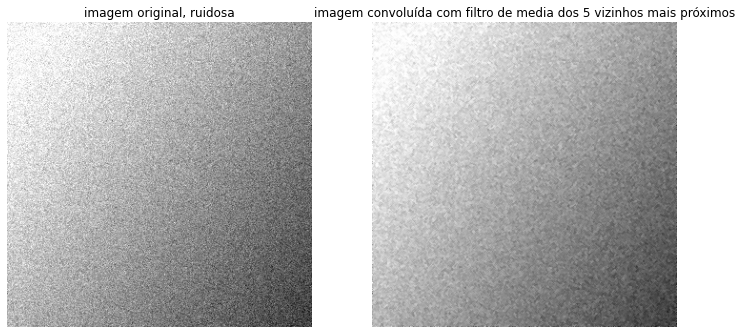

In [24]:
# exibindo imagem original e filtrada por k vzinhos
plt.figure(figsize=(12,12)) 
plt.subplot(121)
plt.imshow(cv2.cvtColor(img2_pb, cv2.COLOR_BGR2RGB), cmap="gray", vmin=0, vmax=255)
plt.title("imagem original, ruidosa")
plt.axis('off')
plt.subplot(122)
plt.imshow(cv2.cvtColor(imgNova, cv2.COLOR_BGR2RGB), cmap="gray", vmin=0, vmax=255)
plt.title("imagem convoluída com filtro de media dos 5 vizinhos mais próximos")
plt.axis('off')

## Filtro da mediana

A principal característica do filtro medianBlur é que o pixel da nova imagem é sempre um valor de pixel da imagem anterior. Isso não causa o efeito de suavização de borda como o filtro blur e GaussianBlur.

O tamanho do kernel para medianBlur deve ser um valor ímpar

(-0.5, 319.5, 319.5, -0.5)

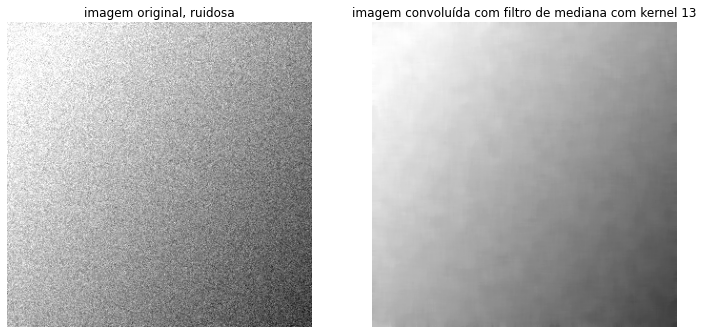

In [26]:
median=cv2.medianBlur(img2_pb,13)

# exibindo imagem original e filtrada por filtro da mediana
plt.figure(figsize=(12,12)) 
plt.subplot(121)
plt.imshow(cv2.cvtColor(img2_pb, cv2.COLOR_BGR2RGB), cmap="gray", vmin=0, vmax=255)
plt.title("imagem original, ruidosa")
plt.axis('off')
plt.subplot(122)
plt.imshow(cv2.cvtColor(median, cv2.COLOR_BGR2RGB), cmap="gray", vmin=0, vmax=255)
plt.title("imagem convoluída com filtro de mediana com kernel 13")
plt.axis('off')

## Filtro Gaussiano

O GaussianBlur usa um kernel em forma de Gaussiana. Isso é como um cone no centro do kernel, os valores vão decaindo a medida que afasta

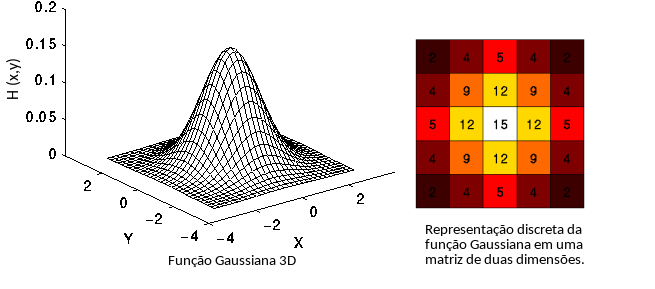

### Exemplo

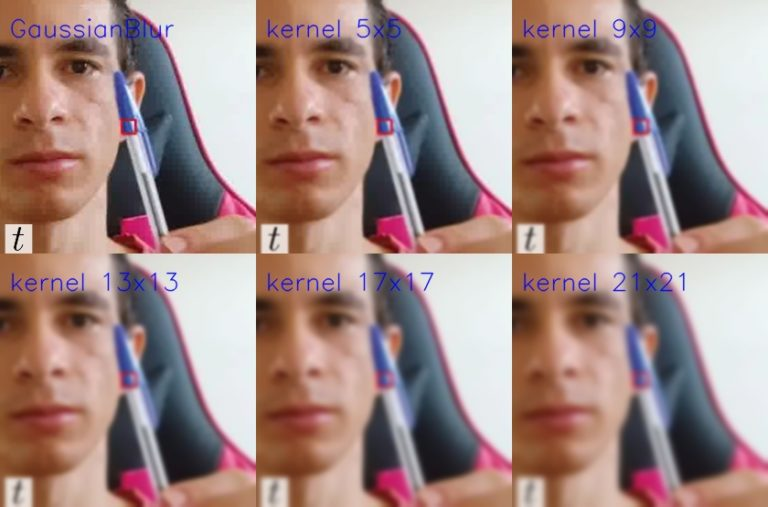

Fonte: https://visioncompy.com/filtros-de-imagens-com-opencv/

(-0.5, 319.5, 319.5, -0.5)

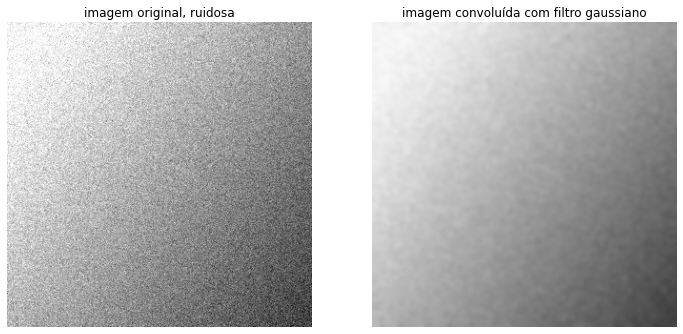

In [27]:
gaussian=cv2.GaussianBlur(src=img2_pb,ksize=(13,13),sigmaX=0)

# exibindo imagem original e filtrada por filtro da gaussiana
plt.figure(figsize=(12,12)) 
plt.subplot(121)
plt.imshow(cv2.cvtColor(img2_pb, cv2.COLOR_BGR2RGB), cmap="gray", vmin=0, vmax=255)
plt.title("imagem original, ruidosa")
plt.axis('off')
plt.subplot(122)
plt.imshow(cv2.cvtColor(gaussian, cv2.COLOR_BGR2RGB), cmap="gray", vmin=0, vmax=255)
plt.title("imagem convoluída com filtro gaussiano")
plt.axis('off')

### A seguir daremos outros exemplos de filtro, incluindo filtros diferenciais e também um exemplo de filtro aleatório.

[[ 0 -1  0]
 [-1  4 -1]
 [ 0 -1  0]]


(-0.5, 255.5, 255.5, -0.5)

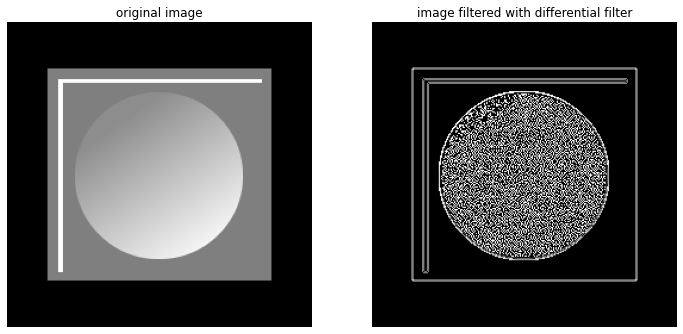

In [6]:
w_diff = np.matrix([[ 0, -1,  0], 
                    [-1,  4, -1], 
                    [ 0, -1,  0]])
print(w_diff)

img1_diff = image_convolution(img1_pb, w_diff)

plt.figure(figsize=(12,12)) 
plt.subplot(121)
plt.imshow(cv2.cvtColor(img1_pb, cv2.COLOR_BGR2RGB), cmap="gray", vmin=0, vmax=255)
plt.title("original image")
plt.axis('off')
plt.subplot(122)
plt.imshow(cv2.cvtColor(img1_diff, cv2.COLOR_BGR2RGB), cmap="gray", vmin=0, vmax=255)
plt.title("image filtered with differential filter")
plt.axis('off')

[[-1  0  1]
 [-1  0  1]
 [-1  0  1]]


(-0.5, 255.5, 255.5, -0.5)

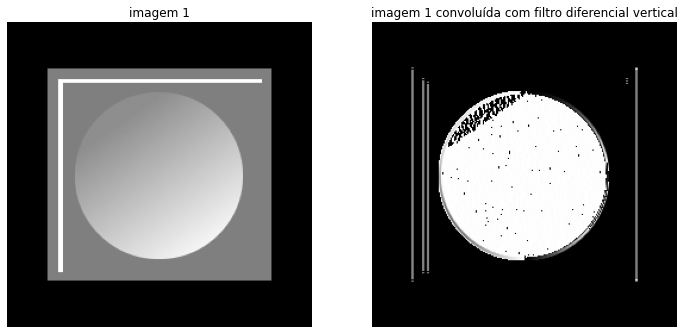

In [7]:
w_vert = np.matrix([[-1, 0, 1], 
                    [-1, 0, 1], 
                    [-1, 0, 1]])
print(w_vert)

img1_vert = image_convolution(img1_pb, w_vert)

# exibindo imagem 1 e filtrada por w_diff
plt.figure(figsize=(12,12)) 
plt.subplot(121)
plt.imshow(img1_pb, cmap="gray", vmin=0, vmax=255)
plt.title("imagem 1")
plt.axis('off')
plt.subplot(122)
plt.imshow(img1_vert, cmap="gray", vmin=0, vmax=255)
plt.title("imagem 1 convoluída com filtro diferencial vertical")
plt.axis('off')

Se você inspecionar os filtros acima, todos eles são projetados para produzir algum tipo de efeito em termos de difusão dos valores de pixel (suavização, por exemplo, filtro médio) ou detecção de transições (filtros diferenciais, por exemplo, bordas verticais).

Mas e se tivermos um * filtro aleatório *?

[[0.57281685 0.25236687 0.40155759 0.29450554 0.68402984 0.62495287
  0.15236222]
 [0.23871661 0.31774599 0.75136523 0.0149819  0.94206042 0.75640679
  0.41739339]
 [0.37768928 0.52272578 0.06577644 0.68937289 0.9467369  0.74134429
  0.7572188 ]
 [0.52806224 0.0498001  0.01373205 0.87087271 0.20270631 0.23165489
  0.71705407]
 [0.25524621 0.66803569 0.68985735 0.9451448  0.06201796 0.79556151
  0.32539596]
 [0.1150022  0.71275798 0.32878937 0.72114523 0.38282411 0.9141173
  0.99779467]
 [0.00387912 0.22429758 0.88978362 0.57734125 0.2527094  0.73153952
  0.73685736]]


(-0.5, 499.5, 464.5, -0.5)

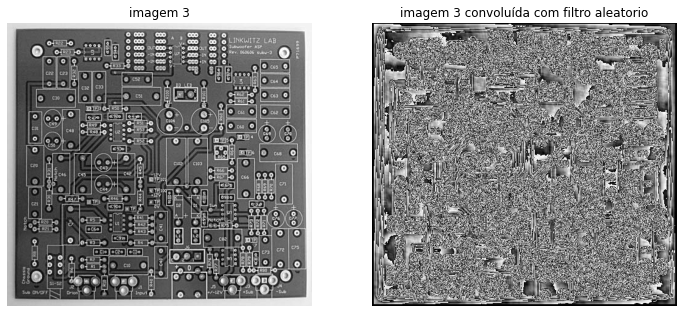

In [8]:
# filtro de valores aleatorios 7x7
w_rand = np.random.random([7,7])
print(w_rand)
img3_wrand = image_convolution(img3_pb, w_rand)

# exibindo imagem 3 e filtrada por w_2 aleatorio
plt.figure(figsize=(12,12)) 
plt.subplot(121)
plt.imshow(img3_pb, cmap="gray", vmin=0, vmax=255)
plt.title("imagem 3")
plt.axis('off')
plt.subplot(122)
plt.imshow(img3_wrand, cmap="gray", vmin=0, vmax=255)
plt.title("imagem 3 convoluída com filtro aleatorio")
plt.axis('off')

#### Não parece bom! Mas é um efeito do filtro aleatório ou há mais alguma coisa errada?

Nosso filtro tem valores positivos que somam muito mais que 1, a energia das regiões locais vai aumentar. Isso, a princípio, aumentaria apenas o brilho da imagem. Mas, na verdade, porque estamos operando em 8 bits, o efeito de tais convoluções sucessivas é * estouro *


In [9]:
np.sum(w_rand)

24.466107041545055

#### Podemos normalizar o filtro pra somar 1

[[0.00845061 0.01324348 0.0236668  0.02460257 0.0324596  0.0039591
  0.0124812 ]
 [0.00971688 0.02868326 0.01802512 0.01776098 0.01866445 0.03604487
  0.01436022]
 [0.01059879 0.02393003 0.02699836 0.00347448 0.02503654 0.03029065
  0.00482022]
 [0.02786864 0.01413727 0.03447522 0.03107609 0.005251   0.0246878
  0.00135719]
 [0.02139168 0.02758951 0.01668206 0.03534536 0.03074017 0.00179374
  0.03026084]
 [0.0298584  0.00901036 0.02598089 0.01451522 0.03178976 0.00331224
  0.02752772]
 [0.02413597 0.03038144 0.02548689 0.02869984 0.02851582 0.00649009
  0.02437054]]


(-0.5, 499.5, 464.5, -0.5)

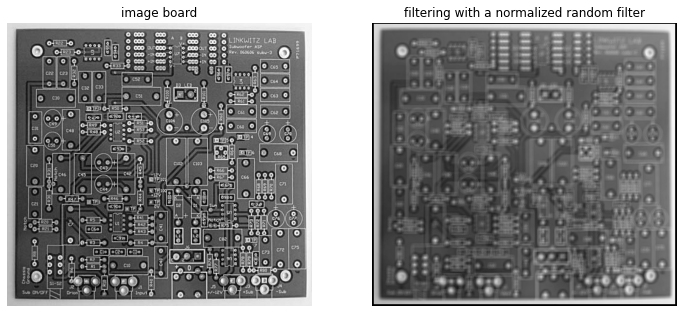

In [10]:
w_rand = np.random.random([7,7])
w_rand = w_rand/np.sum(w_rand)
print(w_rand)
img3_wrand = image_convolution(img3_pb, w_rand)

plt.figure(figsize=(12,12)) 
plt.subplot(121)
plt.imshow(img3, cmap="gray", vmin=0, vmax=255)
plt.title("image board")
plt.axis('off')
plt.subplot(122)
plt.imshow(img3_wrand, cmap="gray", vmin=0, vmax=255)
plt.title("filtering with a normalized random filter")
plt.axis('off')

## Vamos criar alguns ruídos para testar os filtros em outras imagens

(-0.5, 224.5, 224.5, -0.5)

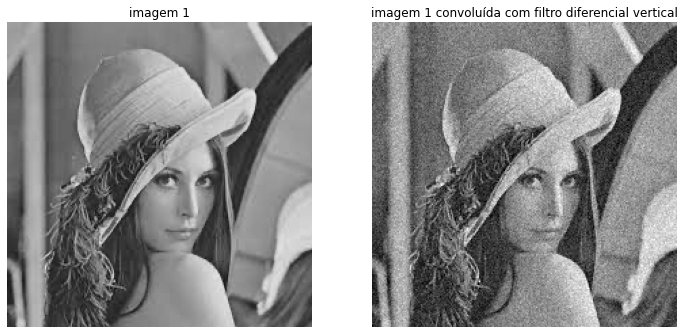

In [11]:
#Criando ruidos na imagem para poder testar os filtros
img4 = cv2.imread("lena.png")
img4_pb = cv2.cvtColor(img4, cv2.COLOR_BGR2GRAY) 
#0 a 15 os valores criados para ruido. Experimente adicionar mais valores.
noise = np.random.normal(0, 15, img4_pb.shape)
noisy = img4_pb + noise
plt.figure(figsize=(12,12)) 
plt.subplot(121)
plt.imshow(img4_pb, cmap="gray", vmin=0, vmax=255)
plt.title("imagem 1")
plt.axis('off')
plt.subplot(122)
plt.imshow(noisy, cmap="gray", vmin=0, vmax=255)
plt.title("imagem 1 convoluída com filtro diferencial vertical")
plt.axis('off')

[[1 1 1]
 [1 1 1]
 [1 1 1]]


(-0.5, 224.5, 224.5, -0.5)

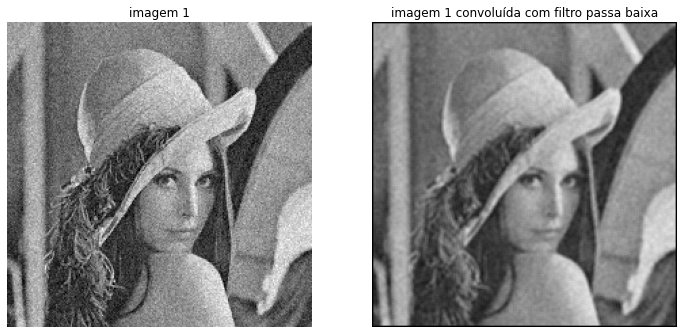

In [12]:
#filtro passa baixa - 1/9
w_passaBaixa = np.matrix([[1,1,1],
                    [1,1,1],
                    [1,1,1]
                 ])
print(w_passaBaixa)
#aqui novamente houve um estouro da imagem, portanto, normalizamos.
w_passaBaixa = w_passaBaixa/np.sum(w_passaBaixa)
img4_passaBaixa = image_convolution(noisy, w_passaBaixa)


# exibindo imagem 1 e filtrada por w_diff
plt.figure(figsize=(12,12)) 
plt.subplot(121)
plt.imshow(noisy, cmap="gray", vmin=0, vmax=255)
plt.title("imagem 1")
plt.axis('off')
plt.subplot(122)
plt.imshow(img4_passaBaixa, cmap="gray", vmin=0, vmax=255)
plt.title("imagem 1 convoluída com filtro passa baixa")
plt.axis('off')

## Filtro passa alta

(-0.5, 183.5, 162.5, -0.5)

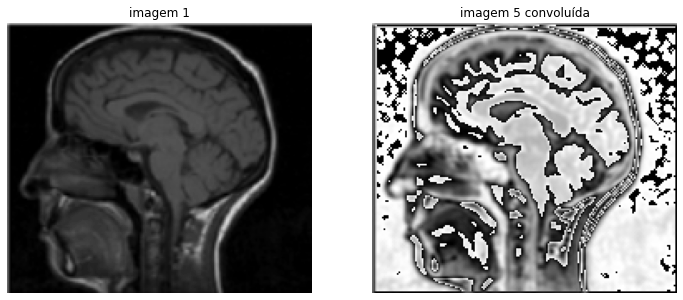

In [13]:
#filtro passa alta utilizando passa baixa
img5 = cv2.imread("img5.png")
img5_pb = cv2.cvtColor(img5, cv2.COLOR_BGR2GRAY) 

#filtro passa baixa - 1/5
w_passaBaixa = np.matrix([[0, 1, 0],
                    [1,1,1],
                    [0,1,0]
                 ])
img5_alta = image_convolution(img5_pb, w_passaBaixa)

#filtro passa alta = img(x,y) - filtroPassaBaixa(x,y)
img_alta = img5_pb - img5_alta

# exibindo imagem 1 e filtrada por w_diff
plt.figure(figsize=(12,12)) 
plt.subplot(121)
plt.imshow(img5_pb, cmap="gray", vmin=0, vmax=255)
plt.title("imagem 1")
plt.axis('off')
plt.subplot(122)
plt.imshow(img_alta, cmap="gray", vmin=0, vmax=255)
plt.title("imagem 5 convoluída")
plt.axis('off')

(-0.5, 183.5, 162.5, -0.5)

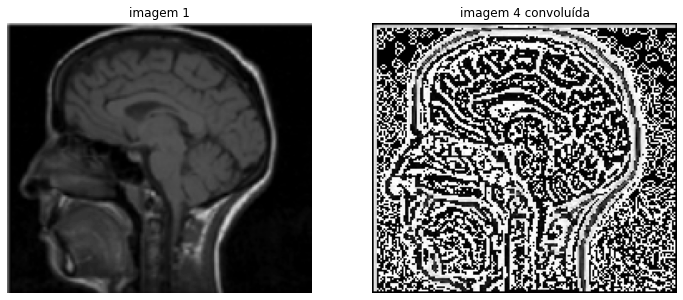

In [14]:
#filtro passa alta com filtro próprio
img5 = cv2.imread("img5.png")
img5_pb = cv2.cvtColor(img5, cv2.COLOR_BGR2GRAY) 

#filtro passa alta - laplace
w_passaAlta = np.matrix([[0, -1, 0],
                    [-1, 4, -1],
                    [0, -1, 0]
                 ])
img5_alta = image_convolution(img5_pb, w_passaAlta)


plt.figure(figsize=(12,12)) 
plt.subplot(121)
plt.imshow(img5_pb, cmap="gray", vmin=0, vmax=255)
plt.title("imagem 1")
plt.axis('off')
plt.subplot(122)
plt.imshow(img5_alta, cmap="gray", vmin=0, vmax=255)
plt.title("imagem 4 convoluída")
plt.axis('off')

O problema deste tipo de filtro é que ele geralmente realça também ruídos do processo de obtenção da imagem

## Blur e Laplace

(-0.5, 183.5, 162.5, -0.5)

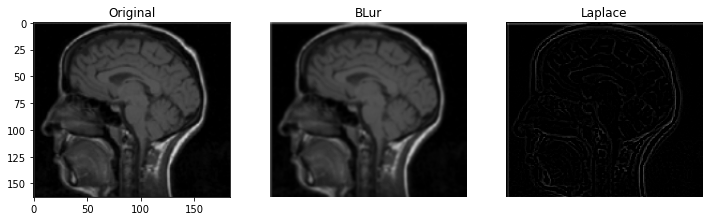

In [15]:
#CV_64F significa que é uma imagem de 1 canal. Se for CV_64FC3 é 3 canais. 


#borrando a imagem: Blur
blur = cv2.GaussianBlur(img5_pb,(3,3),0)

#Filtro passa alta de Laplace.
laplacian = cv2.Laplacian(img5_pb,cv2.CV_64F)

plt.figure(figsize=(12,12)) 
plt.subplot(131)
plt.imshow(img5_pb, cmap="gray", vmin=0, vmax=255)
plt.title("Original")
plt.subplot(132)
plt.imshow(blur, cmap="gray", vmin=0, vmax=255)
plt.title("BLur")
plt.axis('off')
plt.subplot(133)
plt.imshow(laplacian, cmap="gray", vmin=0, vmax=255)
plt.title("Laplace")
plt.axis('off')
